#### QF603 Alpha Generation Project
#### H1: ICHI with CCI
#### H0: CAPM


#### No.1 Libraries and updates

In [1]:
## only run this when necessary
# !pip install pandas-datareader
# !pip install yfinance
# !pip install seaborn
# !pip install --upgrade pandas
# !pip install statsmodels
# !pip install ta

In [2]:
import numpy as np # for numerical computing
import pandas as pd # for tabular data manipulation
import matplotlib.pyplot as plt # for data graphics
import matplotlib as mpl
import datetime
import statsmodels.formula.api as smf
import pandas_datareader.data as web 
from pandas_datareader import data as pdr
%matplotlib inline
import statsmodels.api as sm
from scipy import stats
from ta.trend import IchimokuIndicator
import yfinance as yf
(
    yf
    .pdr_override()
)
import warnings
# To ignore all warnings
warnings.filterwarnings("ignore")
import os
from scipy.interpolate import interp1d

#### No. 2 Data collection and validation

In [3]:
stock_dict_short = \
    {
    'UOB': "U11.SI",
    'DBS': "D05.SI",
    'QQ': '0700.HK',
    'Tencent': 'TCEHY'}
    
  


In [4]:
TICKERS =\
    [
    "^TNX",
    "SPY",
    "^SPX"
    ]

In [5]:
start = \
(
    datetime
    .date(2013, 8, 1)
)

end = \
(
    datetime.date.today()
)

In [6]:
temp = pdr.get_data_yahoo('SPY', start, end)
temp

[*********************100%%**********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2013-08-01,169.990005,170.809998,169.899994,170.660004,141.551956,110438400
2013-08-02,170.279999,170.970001,170.050003,170.949997,141.792557,91116700
2013-08-05,170.570007,170.960007,170.350006,170.699997,141.585129,54072700
2013-08-06,170.369995,170.740005,169.350006,169.729996,140.780563,87495000
2013-08-07,169.190002,169.429993,168.550003,169.179993,140.324326,84854700
...,...,...,...,...,...,...
2023-11-07,435.690002,437.589996,434.510010,436.929993,436.929993,64256100
2023-11-08,437.549988,438.089996,434.869995,437.250000,437.250000,61746000
2023-11-09,438.429993,438.470001,433.399994,433.839996,433.839996,83174400


In [38]:
def get_data_into_csv(dict_of_tickers, start, end):
    data = {}
    for name, ticker in dict_of_tickers.items():
        # Get the current working directory (root folder)
        root_folder = os.getcwd()
        # Specify the file name to check for existence
        file_name = f"{name}.csv"  
        # Replace with the name of the file we are creating
        
        # Check if the file exists in the root folder
        file_exists = os.path.exists(os.path.join(root_folder, file_name))

        if not file_exists:
            temp = pdr.get_data_yahoo(ticker, start, end)
            temp.to_csv(f"{name}.csv")
            
        data[f'{name}'] = pd.read_csv(f"{name}.csv").set_index('Date')
        data[f'{name}'].index = pd.to_datetime(data[f'{name}'].index)
    return data

In [39]:
def clean_data(dict_of_df):
    for stock, df in dict_of_df.items():
        df.dropna(axis=0, inplace=True)
    return

In [40]:
stock = get_data_into_csv(stock_dict_short, start, end)
clean_data(stock)

#### No.3 Indicator functions (ichmoku and CCI)

> CCI

In [41]:
def get_CCI(stock, nCCI=20):
    
    CCI = pd.DataFrame()
    CCI["TP"] =\
    (
        stock[['High', 'Low', 'Close']]
        .mean(axis = 1)
    )
    
    CCI['SMA_TP'] = \
    (
        CCI['TP']
        .rolling(nCCI)
        .mean()
    )
    
    # Calculate Mean Deviation (MD)
    CCI['MD'] = CCI['TP'] - CCI['SMA_TP'].shift(1)
    CCI['MD'] = CCI['MD'].abs()
    CCI['MD'] = CCI['MD'].rolling(window=nCCI).mean()

    CCI['CCI'] = \
    (
        (CCI['TP'] - CCI['SMA_TP']) / \
        (0.015 * CCI['MD'])
    )
    
    return CCI

In [42]:
def get_ICHI(stock, nTS=9, nKS=26, nSS=52):
    ICHI = pd.DataFrame()
    # Calculate Ichimoku Cloud values
    ichi = IchimokuIndicator(stock['High'], stock['Low'], window1=9, window2=26, window3=52)

    # Calculate Ichimoku Cloud values
    ICHI['TS'] = ichi.ichimoku_conversion_line()
    ICHI['KS'] = ichi.ichimoku_base_line()
    ICHI['SSA'] = ichi.ichimoku_a()
    ICHI['SSB'] = ichi.ichimoku_b()
    ICHI['LS'] = stock['Close'].shift(-nKS)

    return ICHI

In [43]:
UOB_ICHI = get_ICHI(stock["UOB"], 9, 26, 52)

#### No. 4 Model Regression

In [44]:
UOB_CCI = get_CCI(stock["UOB"], 20)

In [45]:
ts_info = pd.concat([UOB_CCI, UOB_ICHI], axis = 1)
ts_info.index = pd.to_datetime(ts_info.index)
ts_data = stock["UOB"][['Close']]
ts_data.index = pd.to_datetime(ts_data.index)

In [46]:
def ACF_TS(TS):
    acf_result = sm.tsa.acf(TS, fft=False)

    plt.figure(figsize=(12, 6))
    plt.stem(acf_result)
    plt.xlabel('Lag')
    plt.ylabel('ACF Value')
    plt.title('Autocorrelation Function (ACF)')
    plt.grid(True)
    plt.show()    
    
    return

In [47]:
def Decom_TS(TS):
    ts_data_resampled = TS.resample('D').ffill()

    # Perform seasonal decomposition
    decomposition = sm.tsa.seasonal_decompose(ts_data_resampled, model='additive')


    # Access the decomposed components
    trend = decomposition.trend
    seasonal = decomposition.seasonal
    residual = decomposition.resid

    # Plot the decomposed components
    plt.figure(figsize=(12, 6))

    plt.subplot(411)
    plt.plot(ts_data, label='Original')
    plt.legend(loc='best')

    plt.subplot(412)
    plt.plot(trend, label='Trend')
    plt.legend(loc='best')

    plt.subplot(413)
    plt.plot(seasonal, label='Seasonal')
    plt.legend(loc='best')

    plt.subplot(414)
    plt.plot(residual, label='Residual')
    plt.legend(loc='best')

    plt.tight_layout()
    plt.show()    
    
    result =\
    {
        'Trend': trend,
        'Seasonal': seasonal,
        'Residual': residual                
    }
    
    return pd.DataFrame(result)

In [48]:
#Decom_TS(ts_data.diff().dropna())

In [49]:
def OLS_TS(TS, INFO, intercept = 0):
    OLS = pd.concat([TS, INFO], axis = 1).dropna()
    INFO_list = INFO.columns.tolist()
    TS_target = TS.columns.tolist()    
    if intercept == 1:
        OLS['intercept'] = 1
        INFO_list = INFO.columns.tolist() + ['intercept']    

    OLS[TS_target] = OLS[TS_target].shift(-1)
    OLS.dropna(inplace = True)
    # Define the independent variables (predictors)
    X = OLS[INFO_list]  # Include 'intercept' for the intercept term

    # Define the dependent variable (target)
    y = OLS[TS_target]

    # Fit the OLS regression model
    model = sm.OLS(y, X).fit()
    
    return model

In [50]:
# OLS_TS(ts_data, ts_info, 1).summary()

In [51]:
OLS_outcome = OLS_TS(ts_data, ts_info[['TP', 'TS', 'SSA']])
OLS_outcome.params

TP     1.088016
TS    -0.145925
SSA    0.057874
dtype: float64

In [52]:
print(OLS_outcome)

#### No. 5 Price movement prediction

In [53]:
def plt_strategy_return(signals, Title = 'Strategy_Return'):
    
    signals[["RETURN", "STRATEGY"]] \
    .dropna() \
    .cumsum() \
    .apply(np.exp) \
    .plot(figsize = (16,10), title=Title)  
    return 

In [54]:
def sig_ICHI_CCI(stock, nTS=9, nKS=26, nSS=52, nCCI = 20):
    outcome = stock[['Close']]
    INFO =  pd\
            .concat([get_ICHI(stock, nTS, nKS, nSS), \
                    get_CCI(stock, 20)], axis = 1)
    
    outcome = pd\
            .concat([outcome, \
                    INFO[['SSA', 'SSB', 'CCI']]], axis = 1)
    outcome['SSA_L'] = outcome['SSA'].shift(nKS)
    outcome['SSB_L'] = outcome['SSB'].shift(nKS)    
    outcome["RETURN"] = np.log(outcome["Close"] / outcome["Close"].shift(1))
    outcome["bias"] = 0
    condition = (outcome['Close'] > outcome['SSA_L']) & (outcome['Close'] > outcome['SSB_L']) & (outcome["CCI"] >= 100)
    outcome.loc[condition, 'bias'] = 1
    condition = (outcome['Close'] < outcome['SSA_L']) & (outcome['Close'] < outcome['SSB_L']) & (outcome["CCI"] <= -100)
    outcome.loc[condition, 'bias'] = -1
    # once there is a bias, a trade would result in the NEXT day's return 
    outcome["STRATEGY"] = outcome["bias"].shift(1)
    outcome.dropna(inplace = True)
    outcome["STRATEGY"] = outcome["STRATEGY"] * outcome["RETURN"]    
    outcome["total"] = \
        outcome["STRATEGY"] \
        .cumsum() \
        .apply(np.exp)
    
    INFO_list = ['Close', 'SSA_L', 'SSB_L', 'CCI', 'RETURN', 'bias', 'STRATEGY', 'total']
    outcome = outcome[INFO_list]
    
    return outcome

In [55]:
def sig_OLS_predict(stock, OLS_obj):
    INFO_list = OLS_obj.params.index.tolist()
    outcome = stock[['Close']]
    outcome[INFO_list] =  pd\
                .concat([get_ICHI(stock, 9, 26, 52), \
                         get_CCI(stock, 20)], axis = 1)\
                        [INFO_list]    
    outcome.dropna(inplace = True)    
    # the PREDICTION is for tomorrow's close price, based on today's indicators
    outcome["PREDICTION"] = outcome["Close"].shift(-1)
#     outcome.fillna(0, inplace=True)

    
    OLS =\
        np \
        .linalg \
        .lstsq(outcome[:-1][INFO_list],
               outcome[:-1]["PREDICTION"],
               rcond = None)[0]   

    outcome["PREDICTION"] =\
        np.dot(outcome[INFO_list], 
                OLS)
    
    outcome["RETURN"] = np.log(outcome["Close"] / outcome["Close"].shift(1))
    # the bias is basically view on market, 
    # based on predicted close would be higher or lower than today's Close
    # a threshold is defined for similiar purpose as confidence intervals    
    threshold = 0.002
    outcome["bias"] = \
    (
        np.where\
            (abs(outcome["PREDICTION"] / outcome["Close"] - 1) > threshold,\
                 np.sign(np.log(outcome["PREDICTION"] / outcome["Close"])), 0)    
    ) 
    
    # once there is a bias, a trade would result in the NEXT day's return 
    outcome["STRATEGY"] = outcome["bias"].shift(1)
    outcome.dropna(inplace = True)
    outcome["STRATEGY"] = outcome["STRATEGY"] * outcome["RETURN"]

    outcome["total"] = \
        outcome["STRATEGY"] \
        .cumsum() \
        .apply(np.exp)

    return outcome

In [56]:
def cal_MDD(performs):
    MDD = \
    (
    pd
    .DataFrame(index = performs.index)
    .fillna(0.0)
    )
    
    MDD['Max'] = performs["total"].cummax()
    MDD['Drawdown'] = performs["total"] - MDD['Max']
    MDD['DD%'] = MDD['Drawdown'] / MDD['Max'] * 100
    
    MDD = MDD.dropna()
    
    MDD['DD_Flag'] = 0
    DD = []
    flag = 0
    nDD = 1
    
    for idx in MDD.index:
        if MDD.loc[idx]['Drawdown'] == 0:
            # flag is to rememeber if in DrawDown period
            if flag == 0:
                continue
            else:
                # a DD period is just ended
                # clear flag, ready for next DD seriel number
                flag = 0
                nDD += 1
        # if Drawdown < 0, entering a DD period
        else:
            flag = 1
            MDD.loc[idx, 'DD_Flag'] = nDD
            
    grouped = MDD[MDD['DD_Flag'] != 0].groupby('DD_Flag')
    index_values = performs

    for flags, group in grouped:
        
        s_date = group.index.min()
        e_date = group.index.max()
        # like how we opened position on the next day, close is also shifted
        if len(MDD[e_date:].index) > 1:
            e_date = MDD[e_date:].index[1]
 
        
        days = (e_date.to_pydatetime() - s_date.to_pydatetime()).days
        loss = group['Drawdown'].min()
        loss_pct = group['DD%'].min()

        DD += [[flags, s_date, e_date, days, loss, loss_pct]]
    DD = pd.DataFrame(DD)
    column_names = ['S/N', 'DD_start', 'DD_end', 'Days', 'DD_Max', 'DD%']
    
    DD.columns = column_names
    return [MDD, DD]

In [57]:
def see_perform(performs):
    performance = []
    
    ACCURACY =\
        np \
        .sign(performs["STRATEGY"]
             ) \
        .value_counts()
    ACCURACY.index = ['Neutral', 'WIN', 'LOSS']
    ACCURACY = pd.DataFrame(ACCURACY).T
    ACCURACY["WIN%"] = \
        ACCURACY["WIN"] / (ACCURACY["WIN"] + ACCURACY["LOSS"])
    performance = [ACCURACY]
    performance += cal_MDD(performs)
#     print(ACCURACY[['Neutral', 'WIN', 'LOSS']])
    return performance
    
    

#### No. 6 Signal Generation

#### No. 7 Signal visualization

In [58]:
def plot_all_returns(more_stocks, start, end, OLS_info=['TP', 'TS', 'SSB'], func = sig_OLS_predict): 

    full_stocks = get_data_into_csv(more_stocks, start, end)
    clean_data(full_stocks)
    all_returns = {}
    WinLoss = pd.DataFrame()
    
    for name, df in full_stocks.items():
        
        test_run = func(full_stocks[f"{name}"], OLS_info)
        pf = see_perform(test_run)

        WinLoss = pd.concat([WinLoss, pf[0]], axis = 0)
        plt_strategy_return(test_run, name)

        all_returns[f'{name}'] = test_run['total'][-1]
        
        
    all_returns = pd.DataFrame(list(all_returns.items()), columns=['Stock', 'Total_R'])
    all_returns.set_index('Stock', inplace=True)
    stock_index = all_returns.index.tolist()
    WinLoss.index =stock_index
    
    all_returns = pd.concat([all_returns, WinLoss[['WIN', 'LOSS', 'WIN%']]], axis = 1)
    
    return all_returns


In [59]:
# Mean_Rev_all = plot_all_returns(stock_dict, start, end, OLS_outcome, sig_OLS_predict)
# Mean_Rev_all

In [60]:
def print_grouped_df(grouped_df):
# grouped object is dict, iterator includes keys and values
    for group_name, group_data in grouped_df.items():
        print(group_name)
        print(group_data)

,Total_R,WIN,LOSS,WIN%
UOB,2.068079,632,582,0.520593
DBS,0.912998,598,591,0.502944
QQ,2.965542,829,750,0.525016
Tencent,13.334884,886,736,0.546239


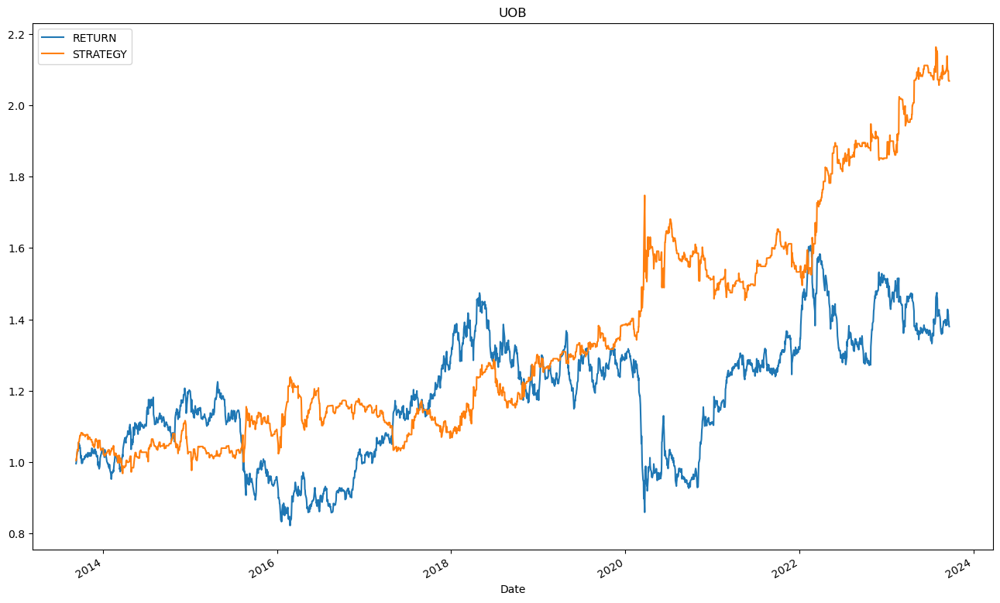

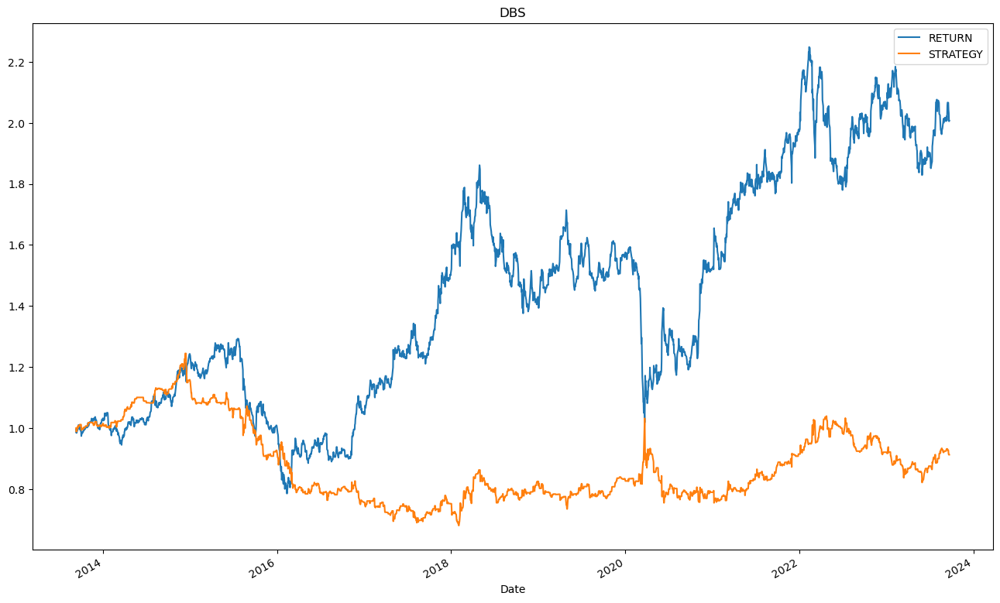

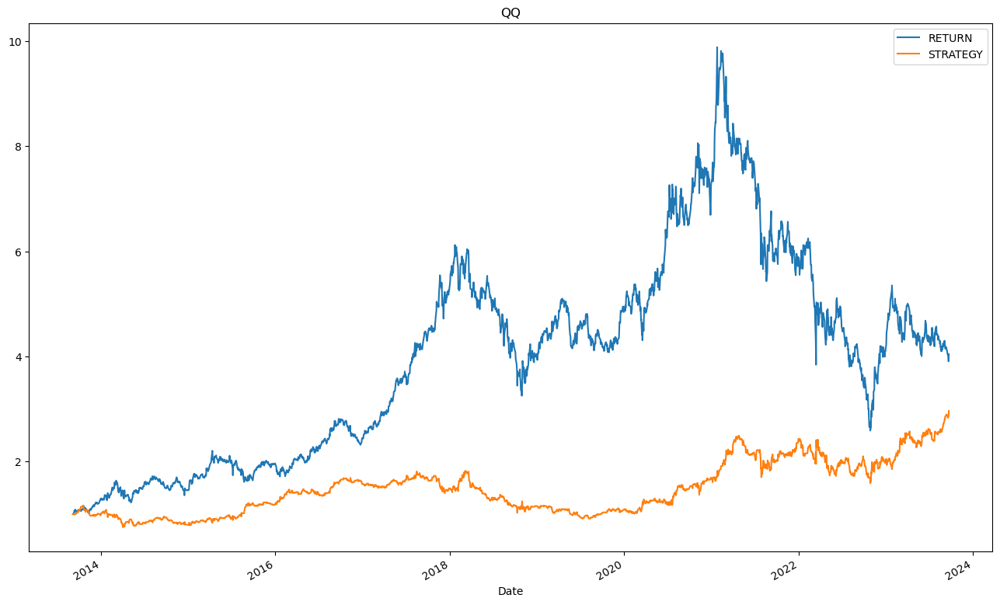

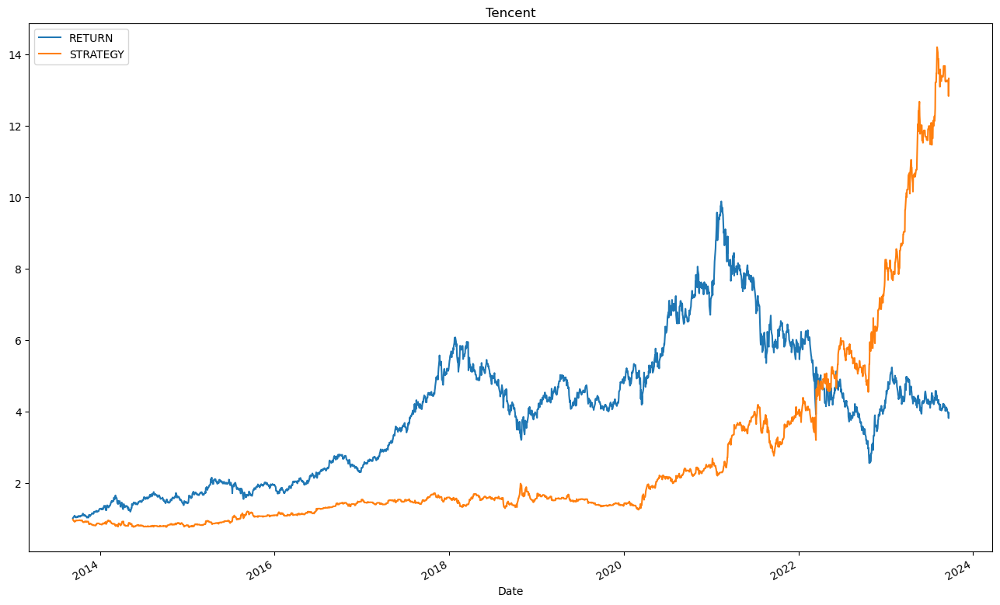

In [61]:
Mean_Rev_all = plot_all_returns(stock_dict_short, start, end, OLS_outcome, sig_OLS_predict)
Mean_Rev_all

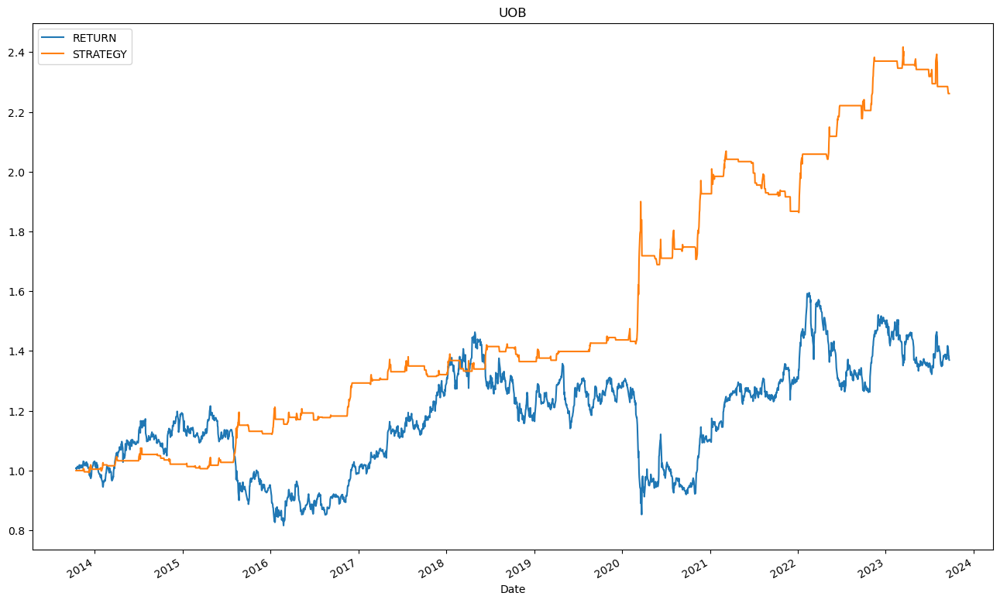

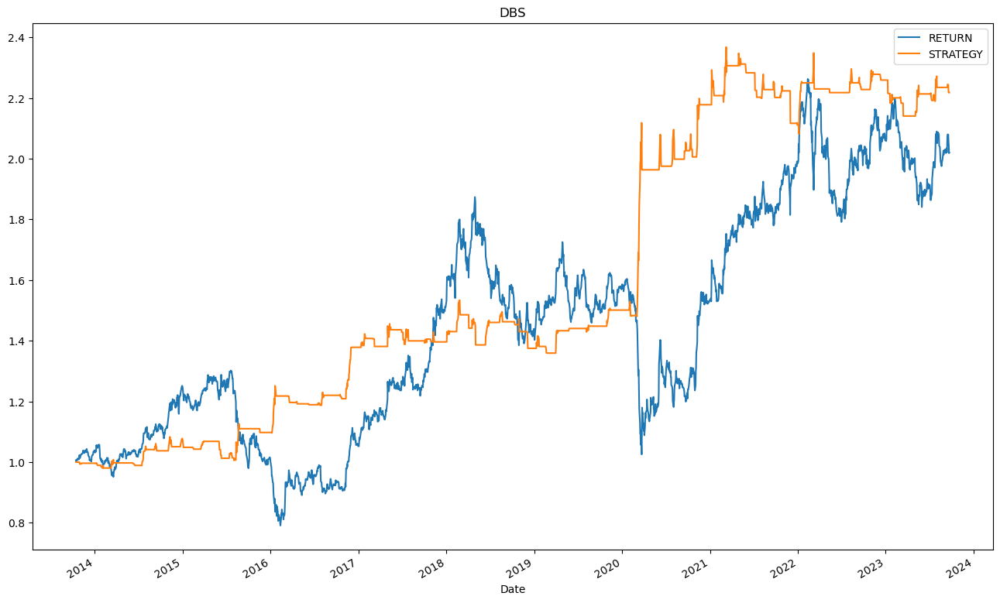

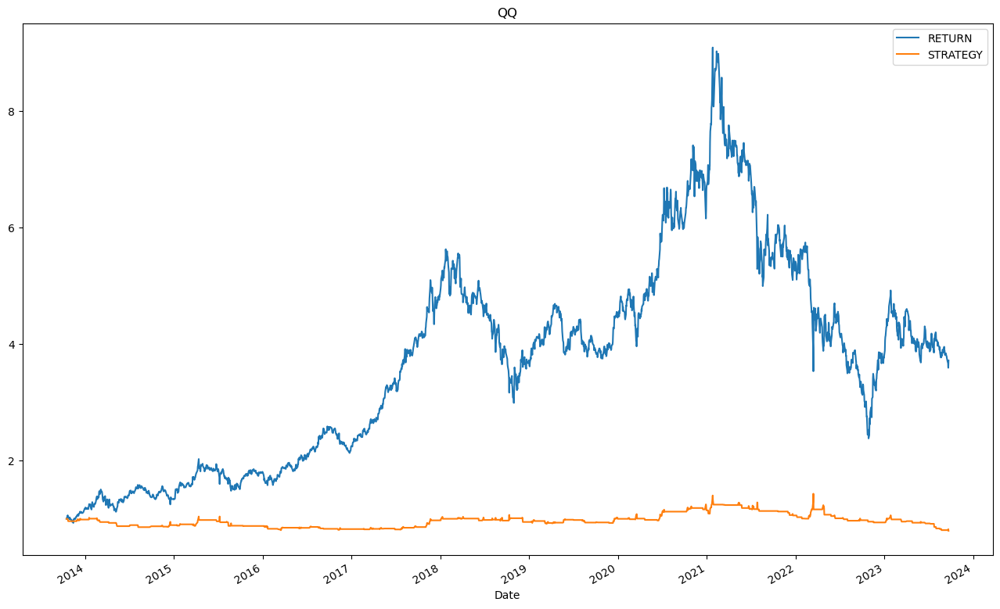

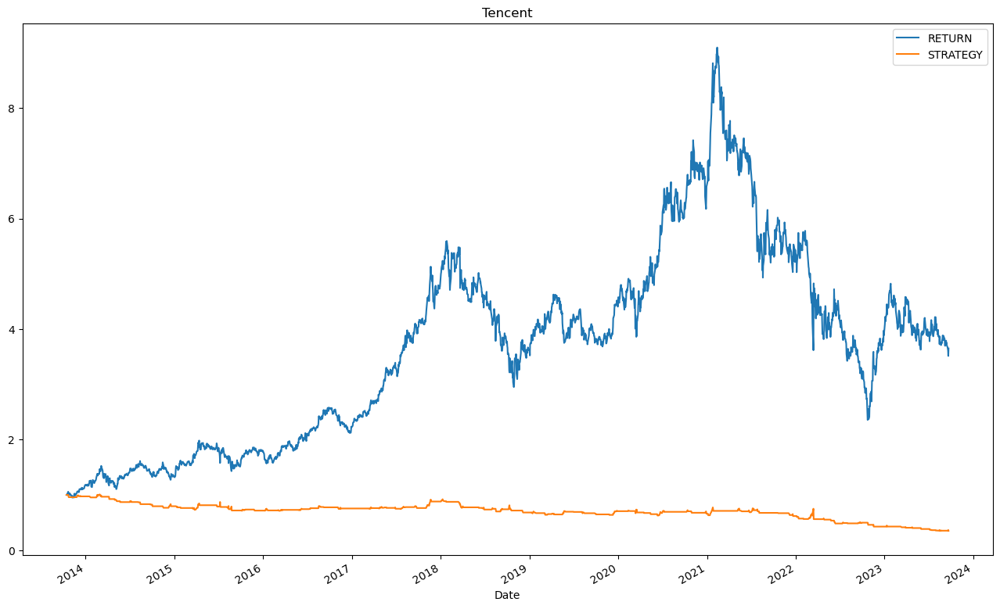

In [62]:
Mmt_all = plot_all_returns(stock_dict_short, start, end, []
                           , sig_ICHI_CCI)


In [63]:
stock_dict_CD = \
    {
    "PTR" :"0857.HK",
    "SNP" :"0386.HK",
    "ICBC":"1398.HK",
    "CICHY":"0939.HK",
    "ACGBY":"1288.HK",
    "CHL":"0941.HK",
    "CHU":"0762.HK",
    "CHA":"0728.HK",
    "PNGAY":"2318.HK",
    "TCEHY":"600519.SS",
    "Wuliangye":"000858.SZ",
    "LFC":"2628.HK",
    "CTB":"2601.HK",
    "CIXX":"0998.HK",
    "BACHY":"3988.HK",
    "CGDDY":"0939.HK",
    "CMBPF":"1988.HK",
    "CDB":"601288.SS",
    "CTBIC":"2601.HK"}

In [64]:
stock_dict_CND = \
{ 'Alibaba': 'BABA',
    'Tencent': '0700.HK',
    'JD.com': 'JD',
    'Pinduoduo': 'PDD',
    'NIO Inc.': 'NIO',
    'Xiaomi': '1810.HK',
    'ZTO Express': 'ZTO',
    'Haidilao': '6862.HK',
    'BYD': '1211.HK',
    'Ping An Insurance': '2318.HK',
    'China Merchants Port Holdings': '0144.HK',
    'SMIC': '0981.HK',
    'TAL Education': 'TAL',
    'Meituan Dianping': '3690.HK',
    'China Life Insurance': '2628.HK',
    'Country Garden Holdings': '2007.HK',
    'Baidu': 'BIDU',
    'NetEase': 'NTES',
    'New Oriental Education': 'EDU'}

In [65]:
stock_dict_USD = \
{ 'AAPL':'AAPL',
    'BA':'BA',
    'BBY':'BBY',
    'GS':'GS',
    'IBM':'IBM',
    'JCI':'JCI',
    "JNJ":"JNJ",
    "KO":"KO",
    "MCD":"MCD",
    "MMM":"MMM",
    "MSFT":"MSFT",
    "PEP":"PEP",
    "PG":"PG",
     'VZ':'VZ',
     "WBA":"WBA",
    "WFC":"WFC",
    "WM":"WM",
    "WMT":"WMT"}

In [66]:
stock_dict_USND = \
{ 'AMZN':"AMZN",
    'GOOGL': "GOOGL",
    'META': "META",
    'NFLX': "NFLX",
    'TSLA': "TSLA",
    'BRK-B': "BRK-B", 
    'NVDA': "NVDA",
    'PYPL': "PYPL", 
    'ADBE': "ADBE",
    'CRM': "CRM",
    'ISRG': "ISRG",
    'VRTX': "VRTX",
    'REGN': "REGN",
    'BIIB': "BIIB",
    'MRNA': "MRNA",
    'ZM': "ZM",
    'DOCU': "DOCU",
    'CRWD': "CRWD",
    'SQ': "SQ",
    'W': "W"}

In [67]:
stock_dict_SD = \
{'SGX': 'S68.SI',
    'UMS': '558.SI',
    'Venture': 'V03.SI',
    'OCBC': 'O39.SI',
    'Singtel': 'Z74.SI',
    'Seatrium': 'S51.SI', 
    'YZJ Shipbldg SGD': 'BS6.SI',
    'UOL': 'U14.SI', 
    'CapitaLandInvest': '9CI.SI',
    'Genting Sing': 'G13.SI',
    'Keppel Corp': 'BN4.SI',
    'ThaiBev': 'Y92.SI',
    'ComfortDelGro': 'C52.SI',
    'Wilmar Intl': 'F34.SI',
    'Sembcorp Ind': 'U96.SI',
    'ST Engineering': 'S63.SI',
    'CityDev': 'C09.SI',
    'SATS': 'S58.SI',
    'Jardine C&C': 'C07.SI'}

In [68]:
stock_dict_SND = \
{'3Cnergy': '502.SI',
    'Oceanus': '579.SI',
    'Alset': '40V.SI',
    'Atlantic Nav': '5UL.SI',
    'Banyan Tree': 'B58.SI',
    'Intl Cement': 'KUO.SI',
    'Metis Energy': 'L02.SI',
    'MM2 Asia': '1B0.SI',
    'OUE Healthcare': '5WA.SI',
    'Pollux Prop': '5AE.SI',
    'Trendlines': '42T.SI',
    'Zheneng Jinjiang': 'BWM.SI',
    'Medtecs Intl': '546.SI',
    'Creative': 'C76.SI',
    'Envictus': 'BQD.SI',
    'GSH': 'BDX.SI',
    'MarcoPolo Marine': '5LY.SI',
    'AnAn Intl': 'Y35.SI',
    }

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

,Total_R_MeRe,WIN%_MeRe,Total_R_Mmt,WIN%_Mmt
PTR,0.594574,0.504268,0.996315,0.512500
SNP,1.542656,0.507097,1.073005,0.511364
ICBC,1.384023,0.500371,1.331089,0.541371
CICHY,2.196257,0.511611,1.528085,0.532847
ACGBY,2.761478,0.508248,1.668921,0.544715
CHL,1.571865,0.506377,0.890746,0.515152
CHU,2.595164,0.525658,0.979908,0.507500
CHA,8.012179,0.538947,0.963784,0.515464
PNGAY,1.850935,0.505128,2.017411,0.511727
TCEHY,2.834456,0.516774,1.159097,0.507559


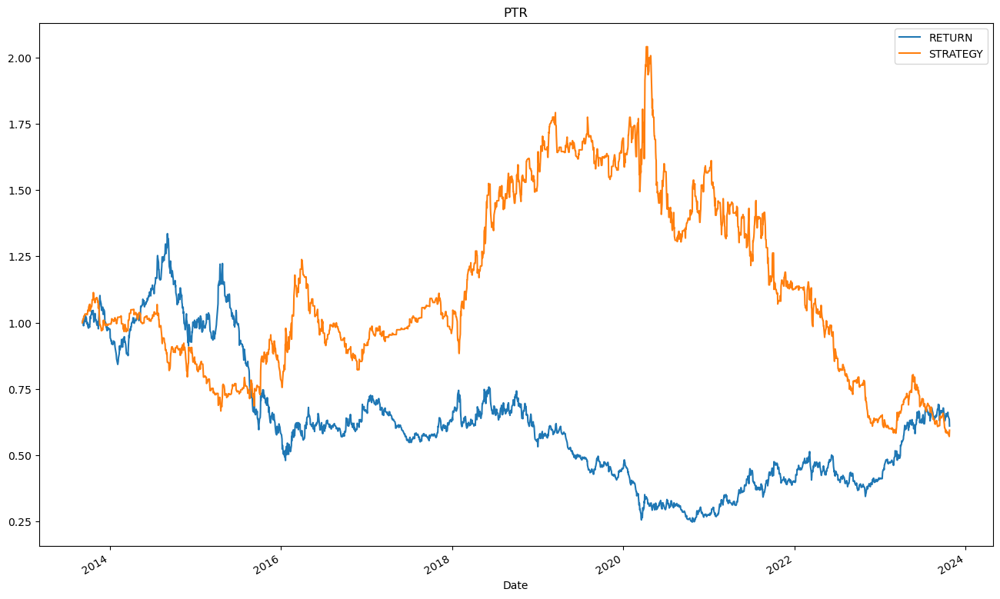

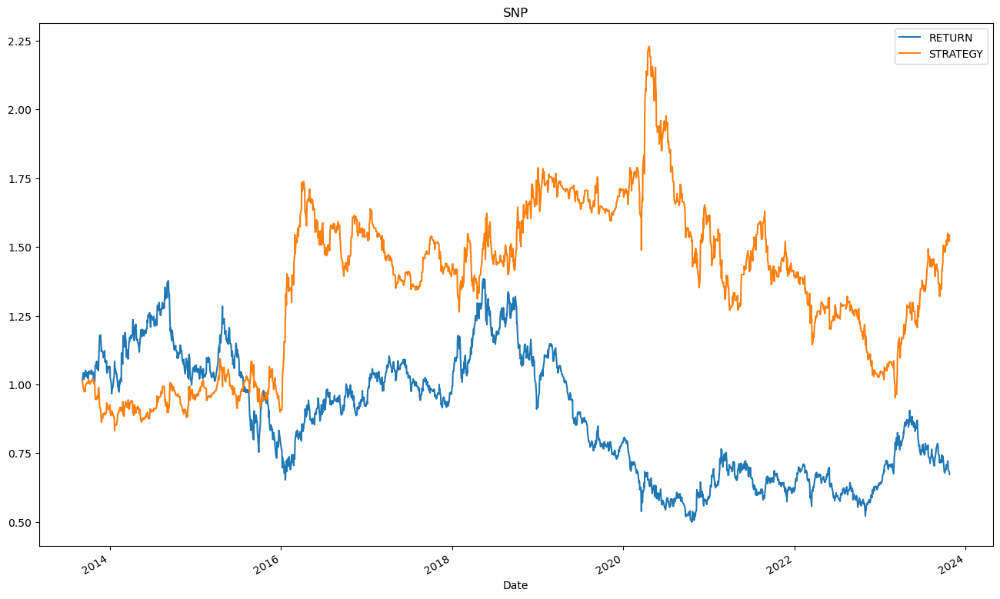

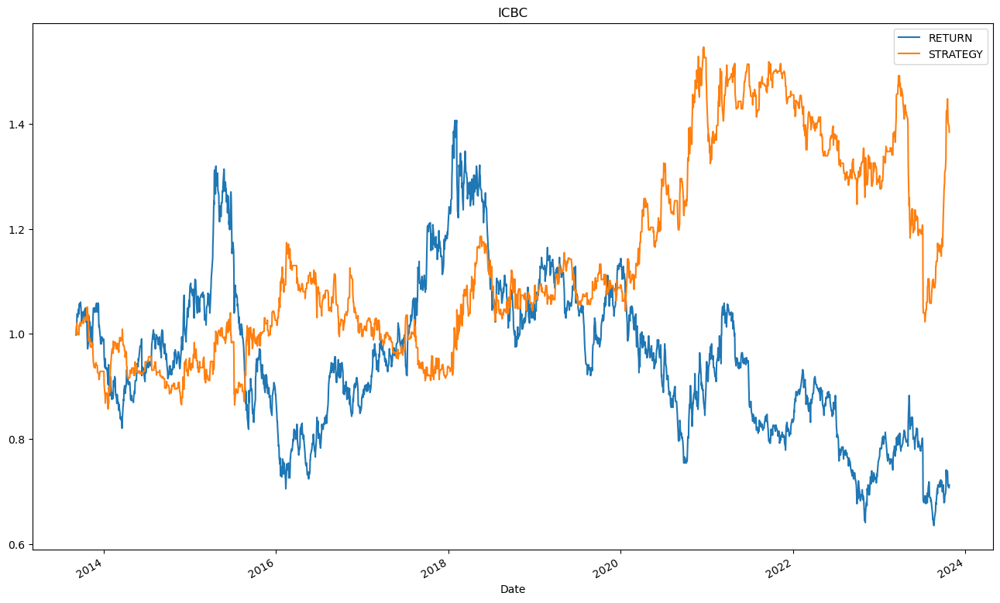

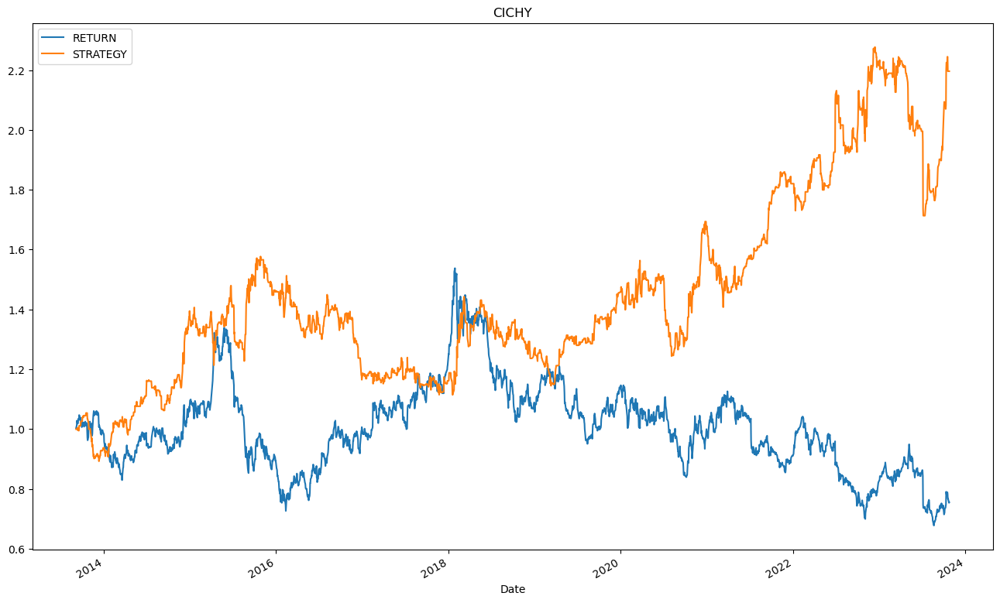

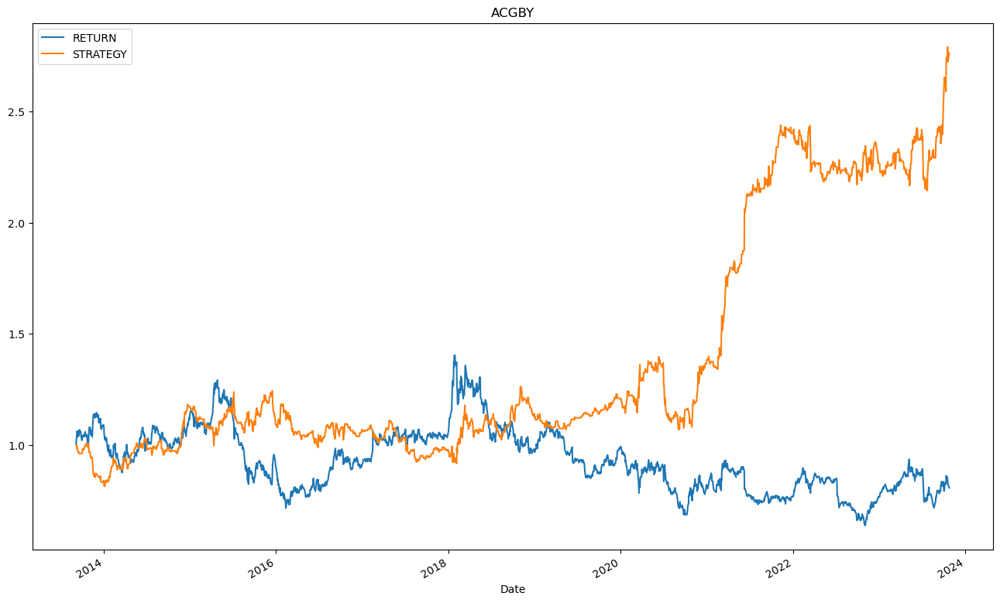

...

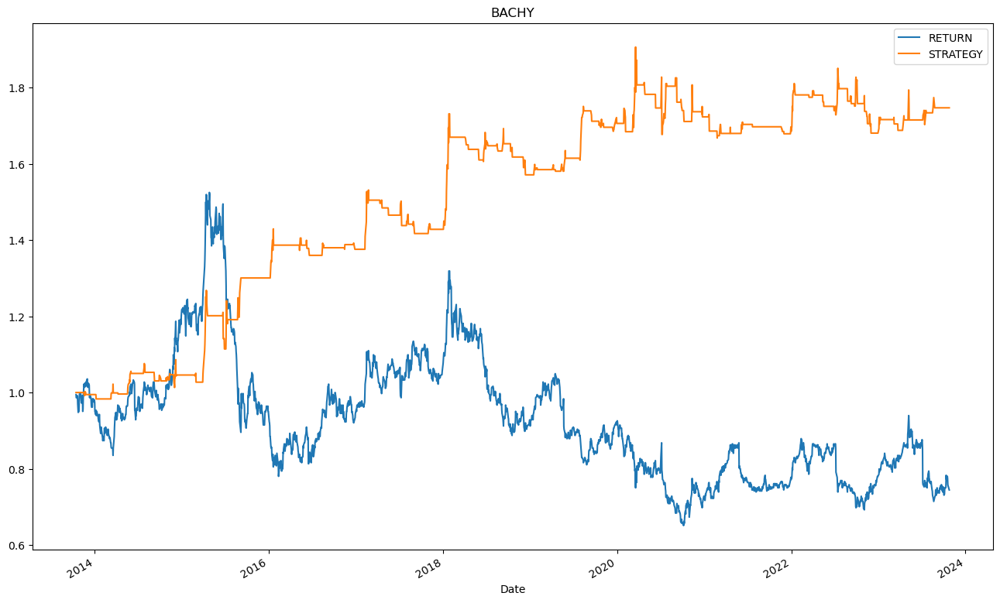

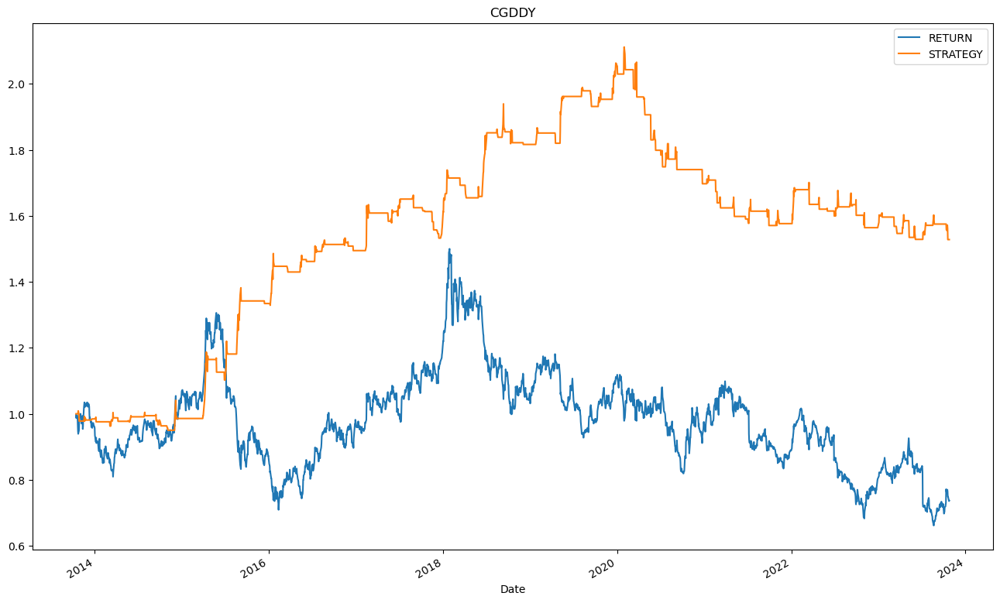

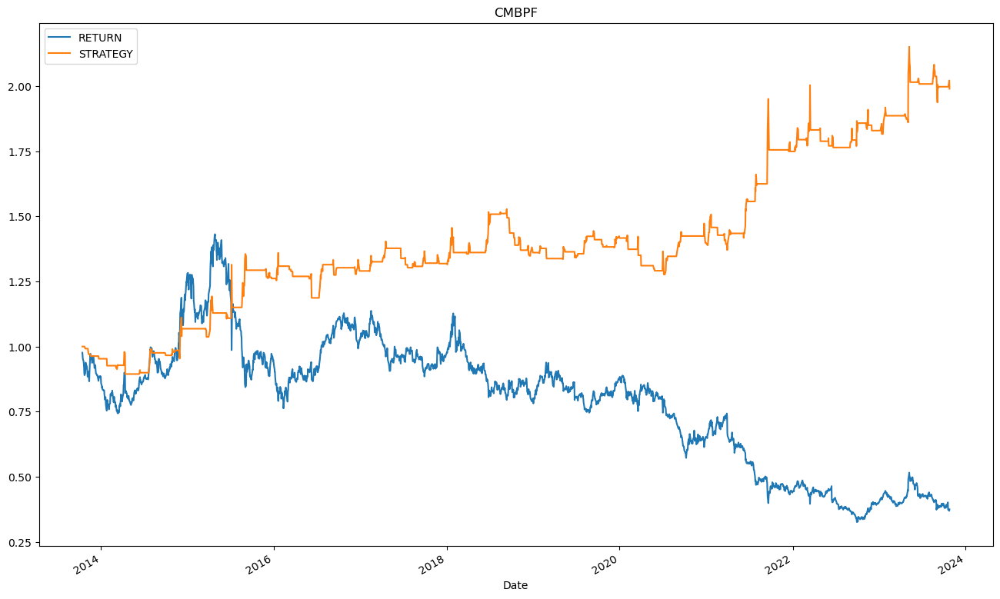

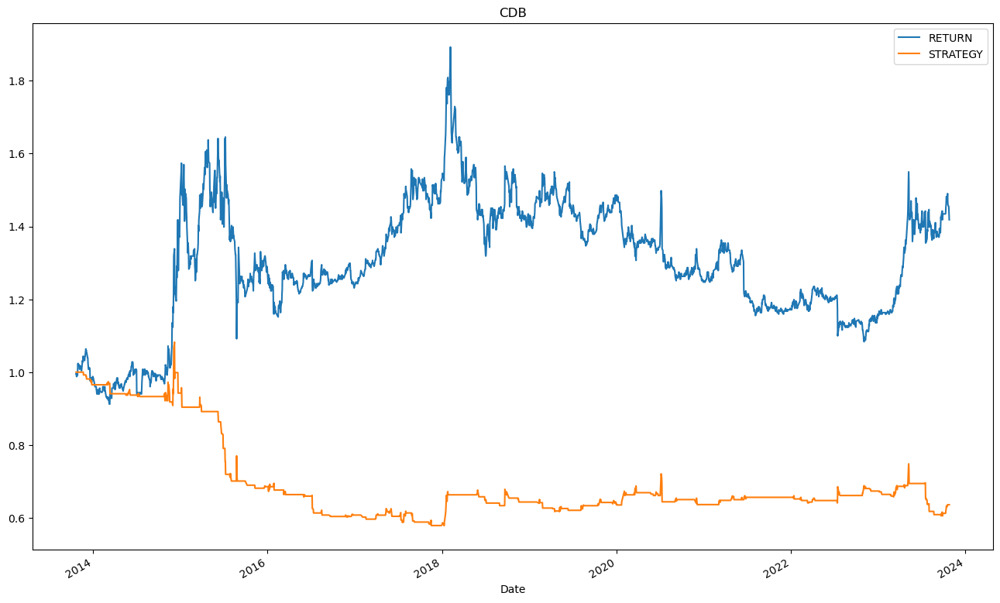

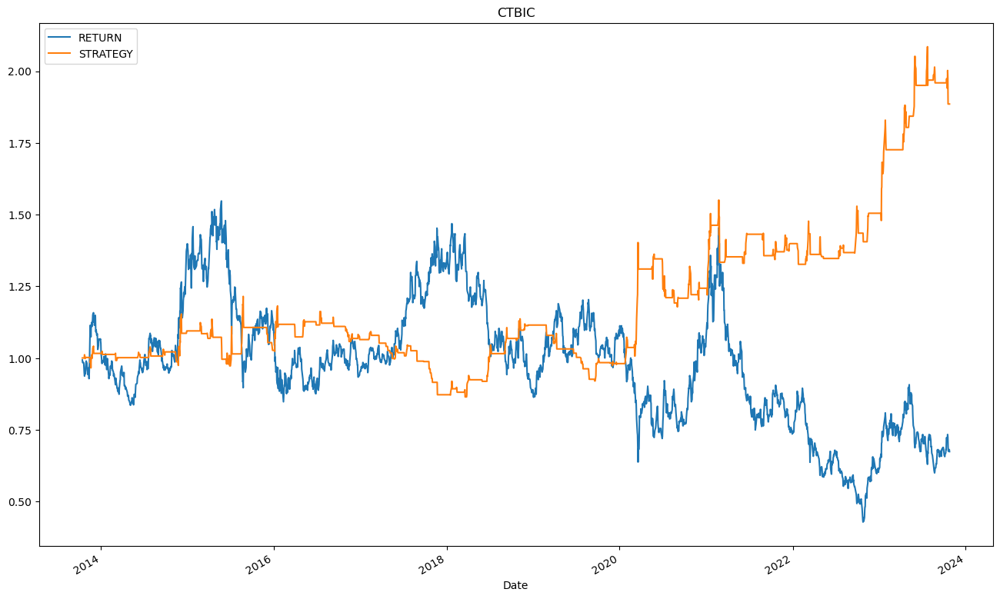

In [69]:
#  Mean_Rev

Mean_Rev_all_CD = plot_all_returns(stock_dict_CD,start, end, OLS_outcome, sig_OLS_predict)
Mean_Rev_all_CD = Mean_Rev_all_CD.drop(['WIN', 'LOSS'], axis = 1)

new_columns_MeRe = {"Total_R": "Total_R_MeRe",
                    "WIN%": "WIN%_MeRe",
                    }
Mean_Rev_all_CD = Mean_Rev_all_CD.rename(columns= new_columns_MeRe)

# Mmt

Mmt_all_CD = plot_all_returns(stock_dict_CD, start, end, [], sig_ICHI_CCI)
Mmt_all_CD = Mmt_all_CD.drop(['WIN', 'LOSS'], axis = 1)

new_columns_Mmt = {"Total_R": "Total_R_Mmt",
                    "WIN%": "WIN%_Mmt"
                    }
Mmt_all_CD = Mmt_all_CD.rename(columns= new_columns_Mmt)

# Concat

CD_happytable = pd.concat([Mean_Rev_all_CD, Mmt_all_CD], axis = 1)
CD_happytable

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

,Total_R_MeRe,WIN%_MeRe,Total_R_Mmt,WIN%_Mmt
Alibaba,0.924084,0.560638,0.592293,0.523684
Tencent,13.334884,0.546239,0.351611,0.537931
JD.com,0.731422,0.658416,0.469942,0.507538
Pinduoduo,1.106285,0.742156,1.335380,0.543651
NIO Inc.,4.343811,0.791045,11.228230,0.551282
Xiaomi,3.926634,0.601816,1.997917,0.552846
ZTO Express,1.635700,0.583569,0.379799,0.535849
Haidilao,3.940373,0.683916,1.735118,0.513761
BYD,1.347155,0.642292,4.001265,0.507692
Ping An Insurance,1.850935,0.505128,2.017411,0.511727


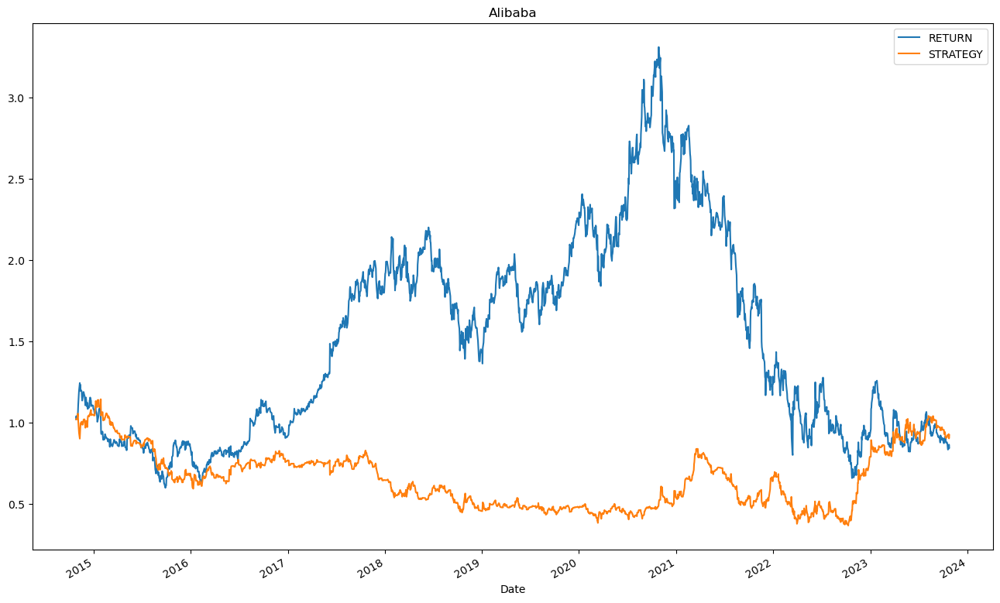

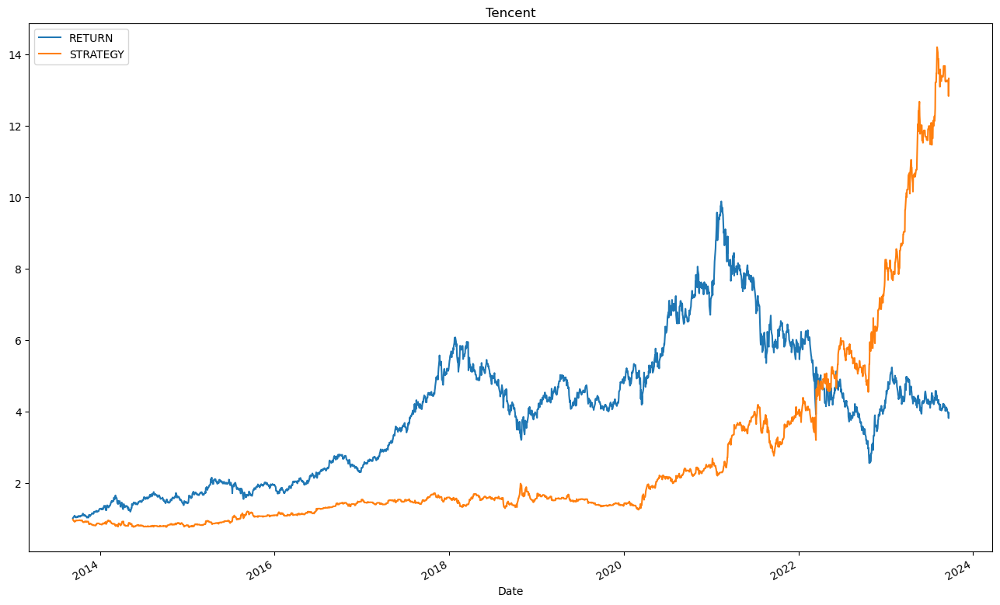

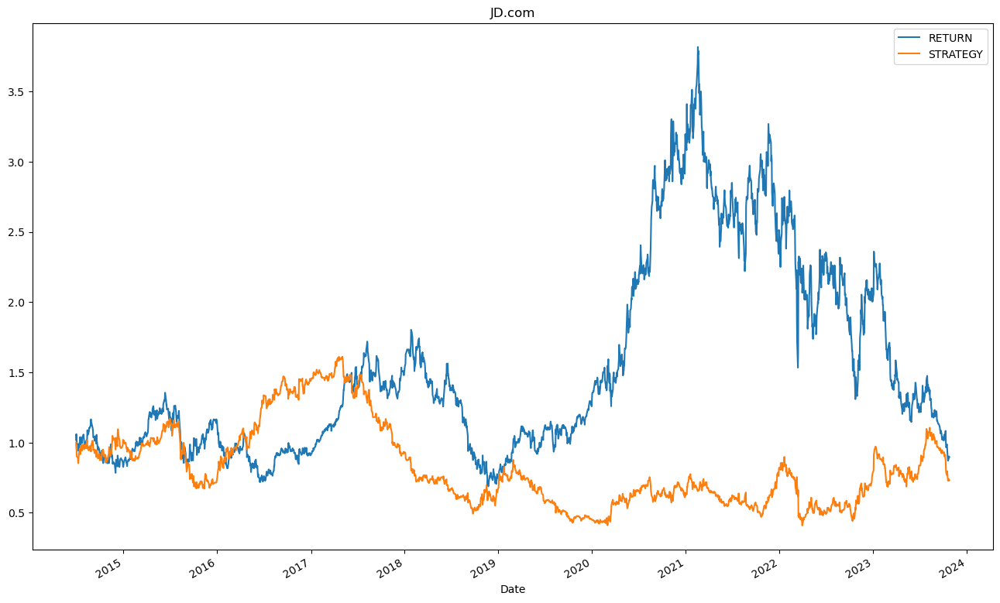

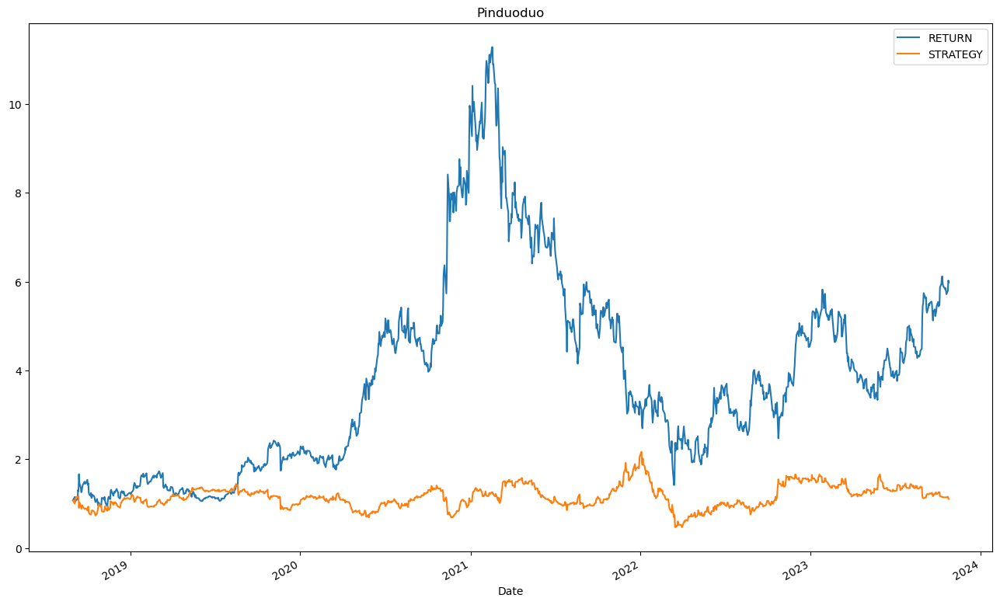

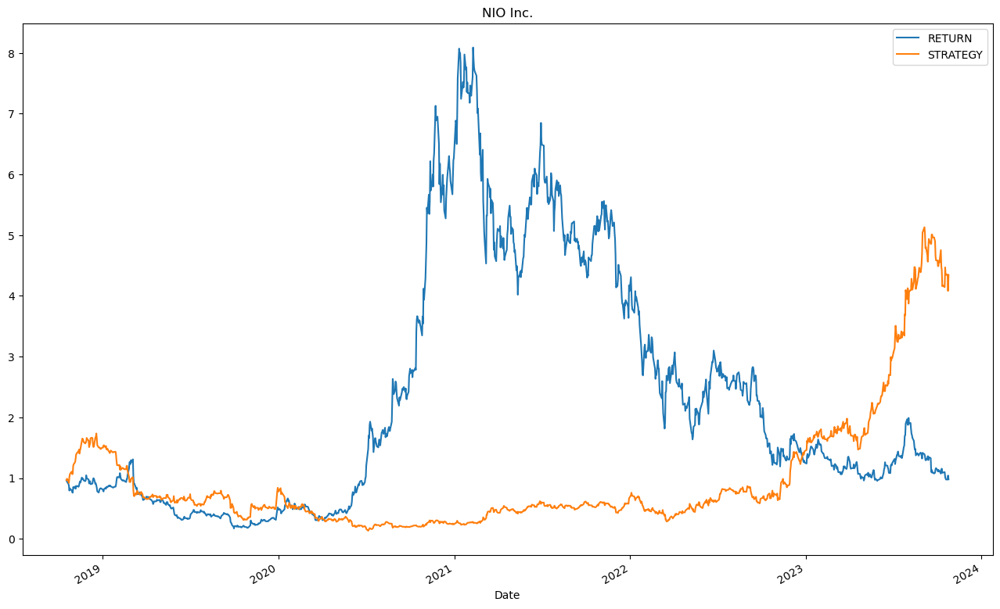

...

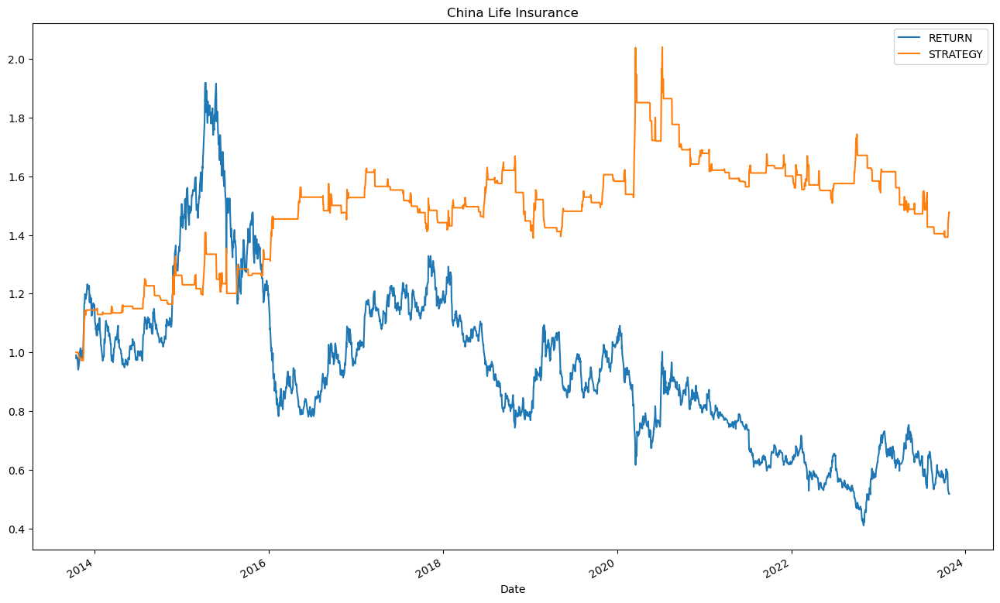

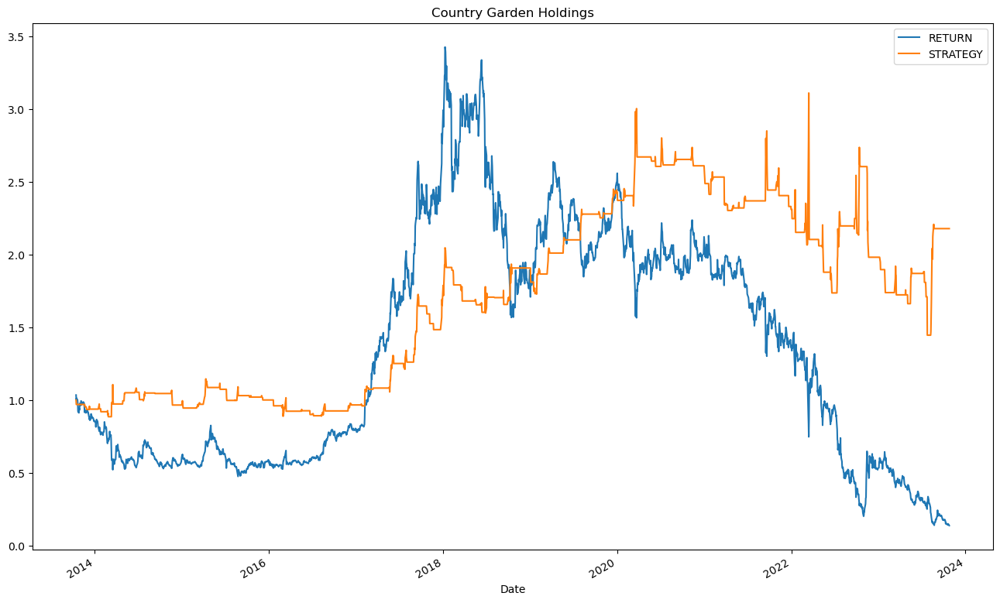

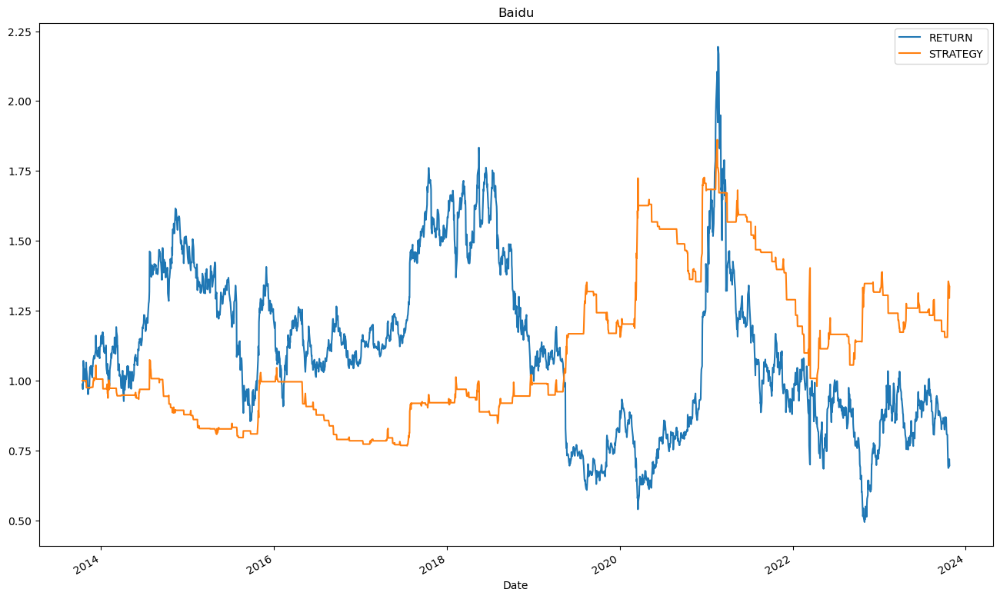

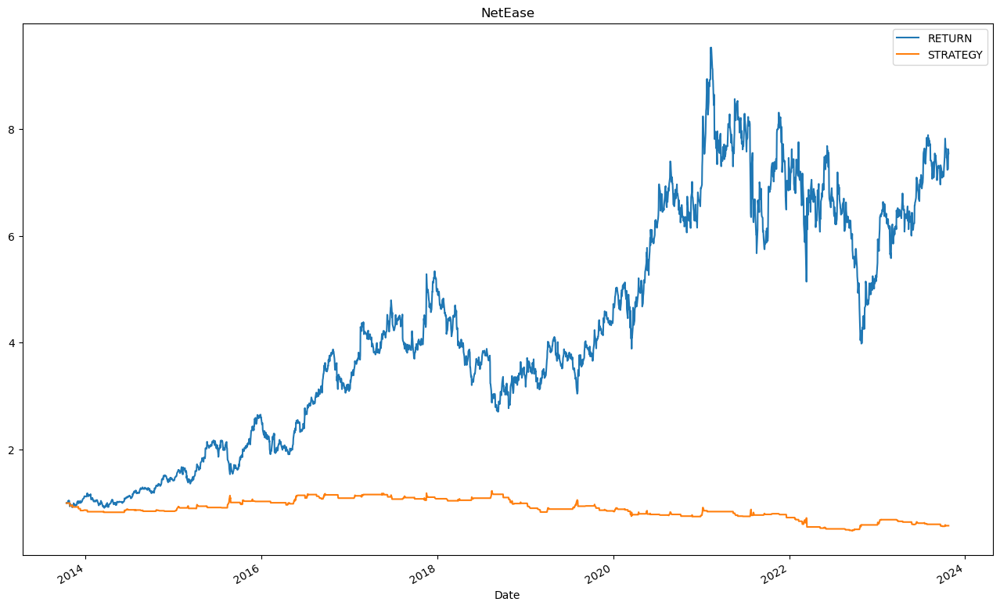

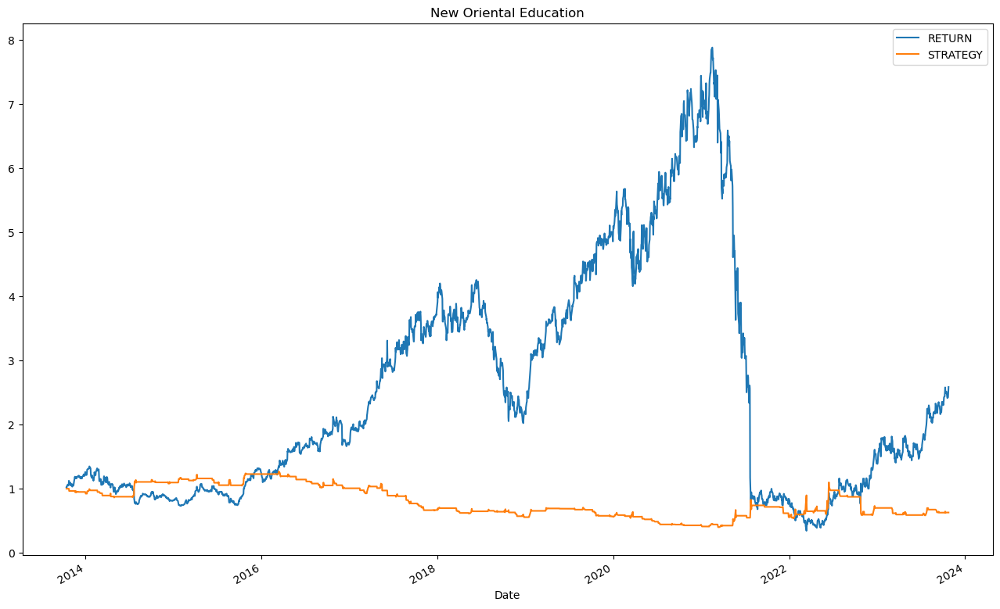

In [70]:
#  Mean_Rev

Mean_Rev_all_CND = plot_all_returns(stock_dict_CND,start, end, OLS_outcome, sig_OLS_predict)
Mean_Rev_all_CND = Mean_Rev_all_CND.drop(['WIN', 'LOSS'], axis = 1)

new_columns_MeRe = {"Total_R": "Total_R_MeRe",
                    "WIN%": "WIN%_MeRe",
                    }
Mean_Rev_all_CND = Mean_Rev_all_CND.rename(columns= new_columns_MeRe)

# Mmt

Mmt_all_CND = plot_all_returns(stock_dict_CND, start, end, [], sig_ICHI_CCI)
Mmt_all_CND = Mmt_all_CND.drop(['WIN', 'LOSS'], axis = 1)

new_columns_Mmt = {"Total_R": "Total_R_Mmt",
                    "WIN%": "WIN%_Mmt"
                    }
Mmt_all_CND = Mmt_all_CND.rename(columns= new_columns_Mmt)

# Concat

CND_happytable = pd.concat([Mean_Rev_all_CND, Mmt_all_CND], axis = 1)
CND_happytable

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

,Total_R_MeRe,WIN%_MeRe,Total_R_Mmt,WIN%_Mmt
AAPL,6.772095,0.533739,0.560360,0.503386
BA,1.013302,0.505910,2.375487,0.533030
BBY,1.661163,0.581337,0.883778,0.500000
GS,0.961462,0.503741,1.051252,0.513742
IBM,1.891738,0.522167,0.916325,0.501129
JCI,1.000461,0.500000,1.410846,0.502222
JNJ,1.762137,0.518052,0.619528,0.532864
KO,3.739240,0.532500,0.684683,0.538976
MCD,3.007579,0.519429,0.847661,0.502146
MMM,1.871498,0.509943,0.749494,0.511156


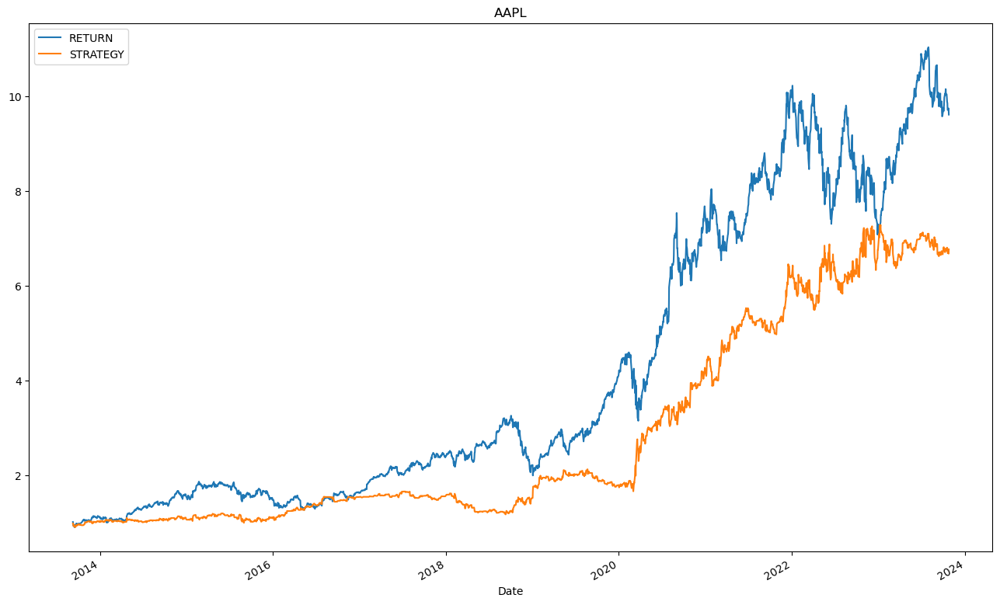

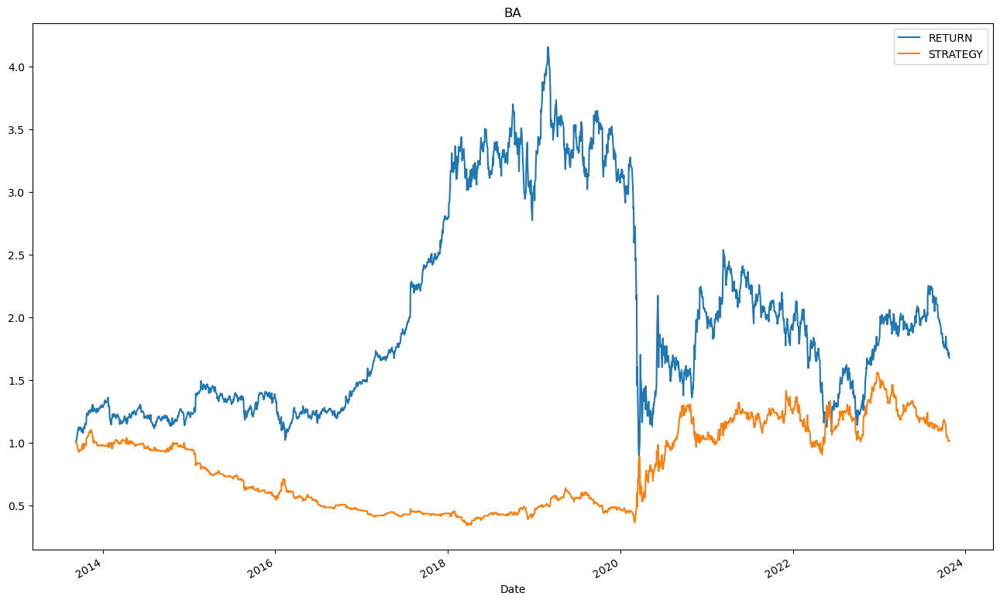

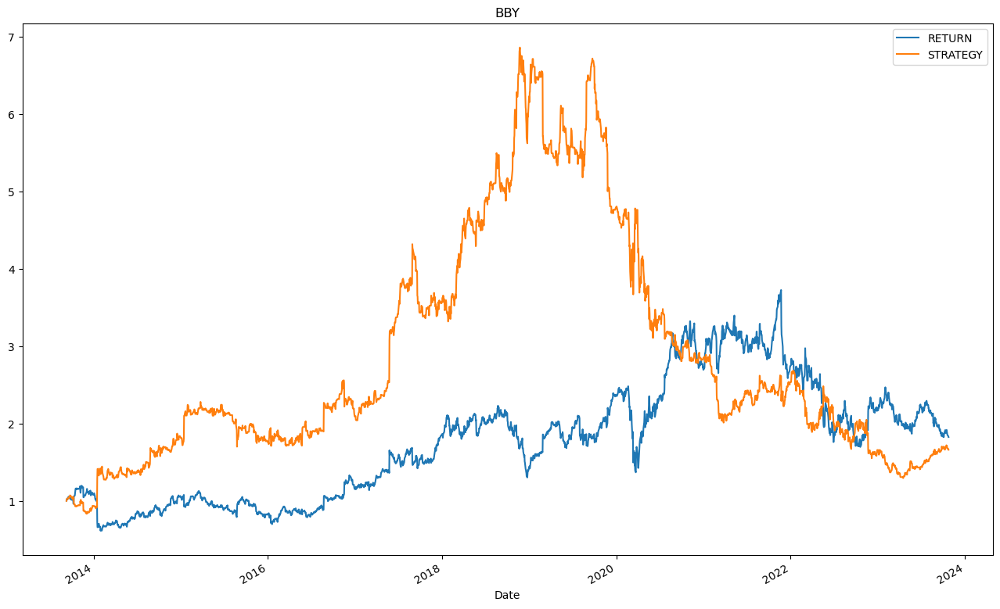

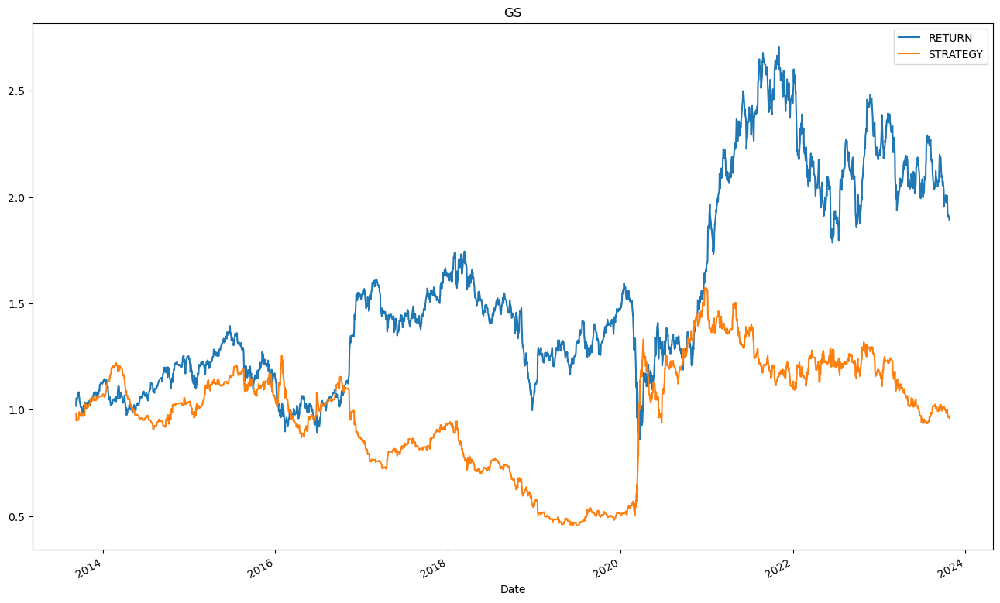

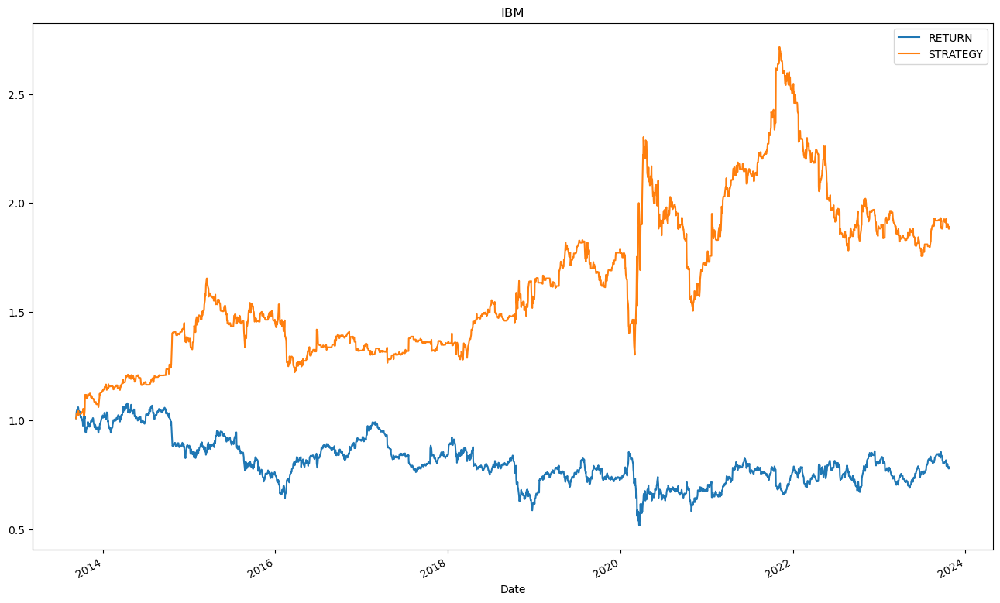

...

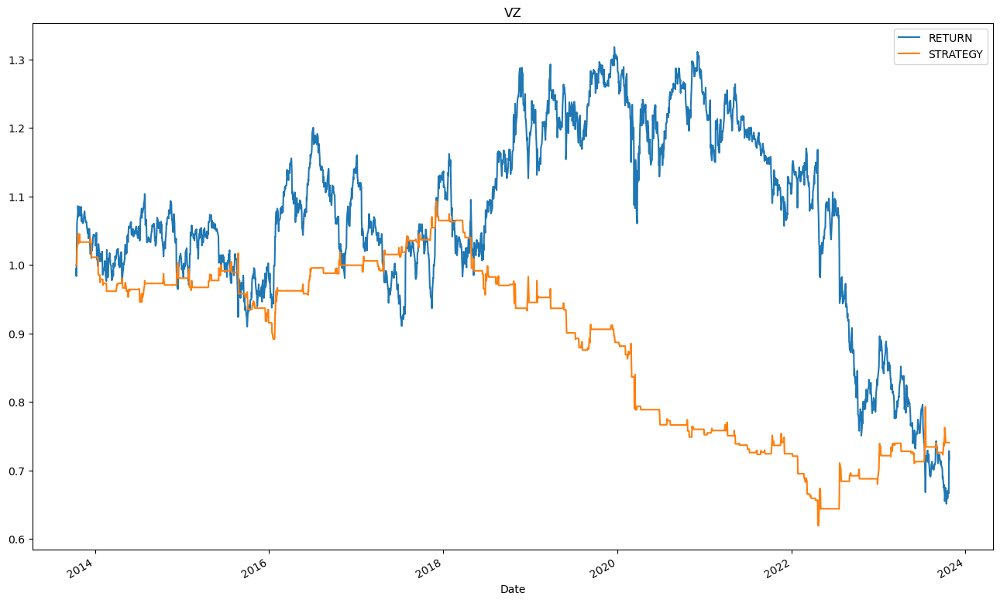

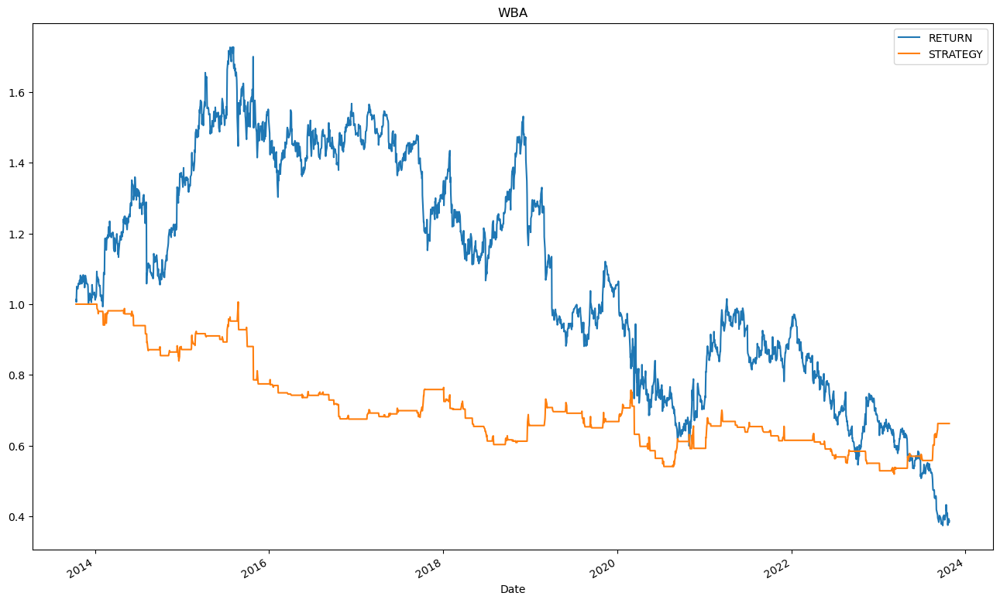

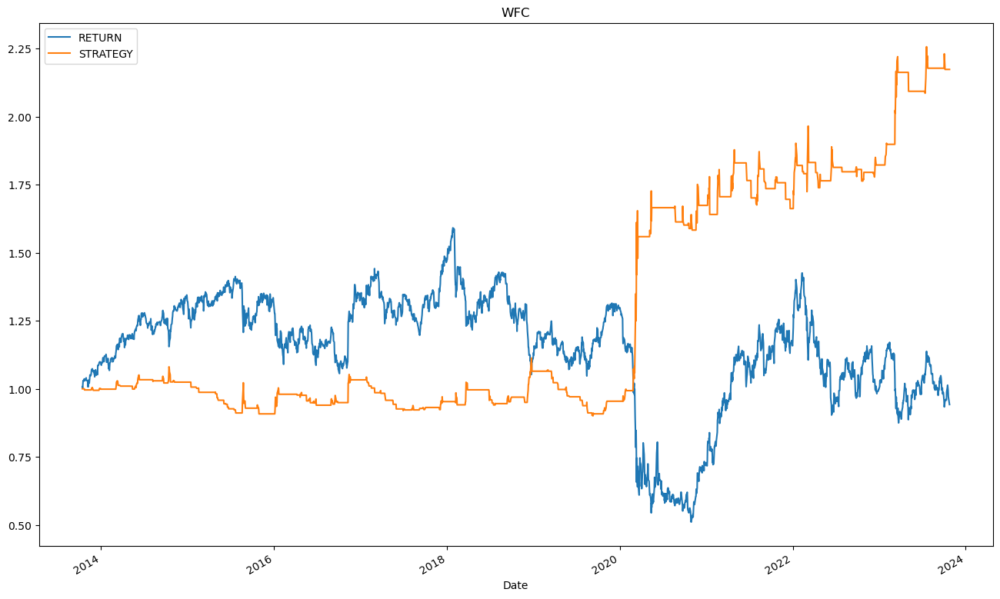

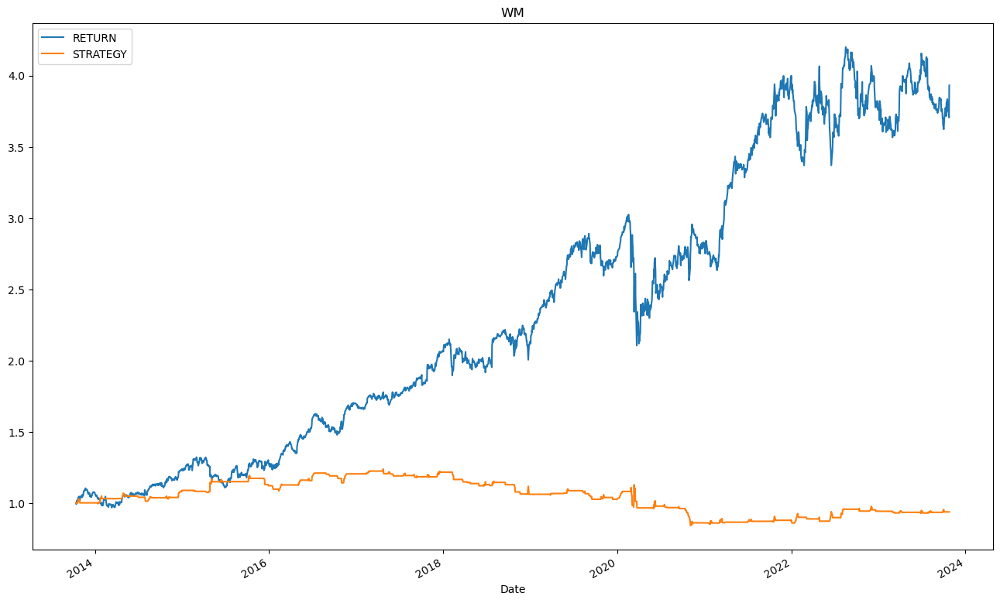

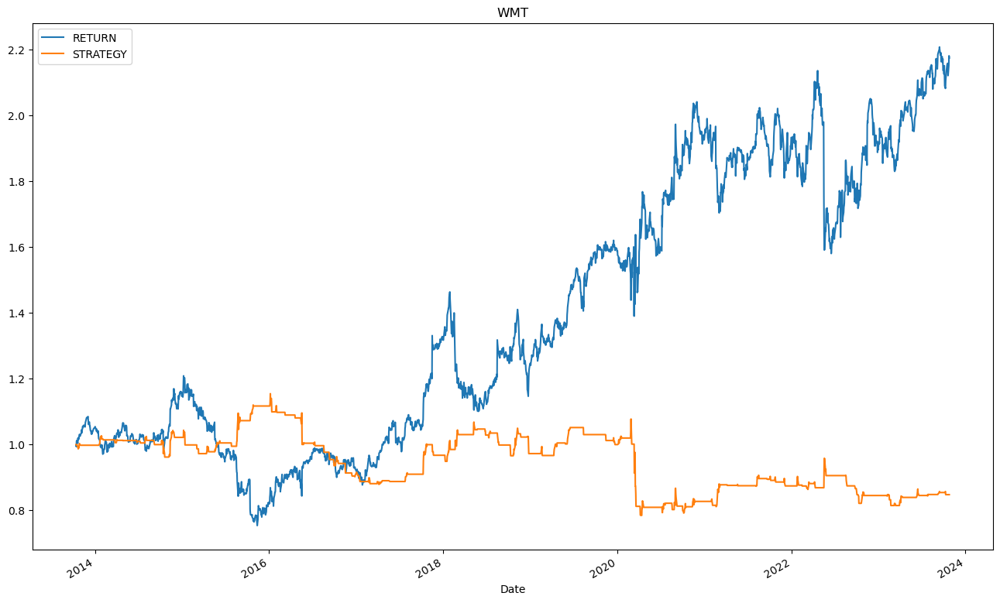

In [71]:
#  Mean_Rev

Mean_Rev_all_USD = plot_all_returns(stock_dict_USD,start, end, OLS_outcome, sig_OLS_predict)
Mean_Rev_all_USD = Mean_Rev_all_USD.drop(['WIN', 'LOSS'], axis = 1)

new_columns_MeRe = {"Total_R": "Total_R_MeRe",
                    "WIN%": "WIN%_MeRe",
                    }
Mean_Rev_all_USD = Mean_Rev_all_USD.rename(columns= new_columns_MeRe)

# Mmt

Mmt_all_USD = plot_all_returns(stock_dict_USD, start, end, [], sig_ICHI_CCI)
Mmt_all_USD = Mmt_all_USD.drop(['WIN', 'LOSS'], axis = 1)

new_columns_Mmt = {"Total_R": "Total_R_Mmt",
                    "WIN%": "WIN%_Mmt"
                    }
Mmt_all_USD = Mmt_all_USD.rename(columns= new_columns_Mmt)

# Concat

USD_happytable = pd.concat([Mean_Rev_all_USD, Mmt_all_USD], axis = 1)
USD_happytable

In [ ]:
Mean_Rev_all_USND = plot_all_returns(stock_dict_USND,start, end, OLS_outcome, sig_OLS_predict)
Mean_Rev_all_USND = Mean_Rev_all_USND.drop(['WIN', 'LOSS'], axis = 1)

new_columns_MeRe = {"Total_R": "Total_R_MeRe",
                    "WIN%": "WIN%_MeRe",
                    }
Mean_Rev_all_USND = Mean_Rev_all_USND.rename(columns= new_columns_MeRe)

# Mmt

Mmt_all_USND = plot_all_returns(stock_dict_USND, start, end, [], sig_ICHI_CCI)
Mmt_all_USND = Mmt_all_USND.drop(['WIN', 'LOSS'], axis = 1)

new_columns_Mmt = {"Total_R": "Total_R_Mmt",
                    "WIN%": "WIN%_Mmt"
                    }
Mmt_all_USND = Mmt_all_USND.rename(columns= new_columns_Mmt)

# Concat

USND_happytable = pd.concat([Mean_Rev_all_USND, Mmt_all_USND], axis = 1)
USND_happytable

In [ ]:
Mean_Rev_all_SD = plot_all_returns(stock_dict_SD,start, end, OLS_outcome, sig_OLS_predict)
Mean_Rev_all_SD = Mean_Rev_all_SD.drop(['WIN', 'LOSS'], axis = 1)

new_columns_MeRe = {"Total_R": "Total_R_MeRe",
                    "WIN%": "WIN%_MeRe",
                    }
Mean_Rev_all_SD = Mean_Rev_all_SD.rename(columns= new_columns_MeRe)

# Mmt

Mmt_all_SD = plot_all_returns(stock_dict_SD, start, end, [], sig_ICHI_CCI)
Mmt_all_SD = Mmt_all_SD.drop(['WIN', 'LOSS'], axis = 1)

new_columns_Mmt = {"Total_R": "Total_R_Mmt",
                    "WIN%": "WIN%_Mmt"
                    }
Mmt_all_SD = Mmt_all_SD.rename(columns= new_columns_Mmt)

# Concat

SD_happytable = pd.concat([Mean_Rev_all_SD, Mmt_all_SD], axis = 1)
SD_happytable

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

AttributeError: 'DataFrame' object has no attribute 'redex'

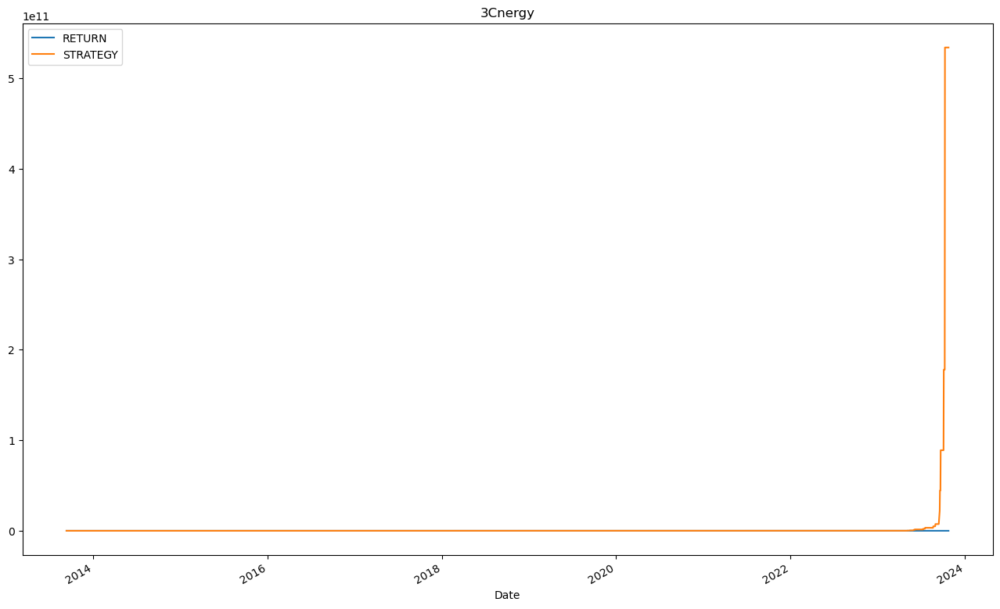

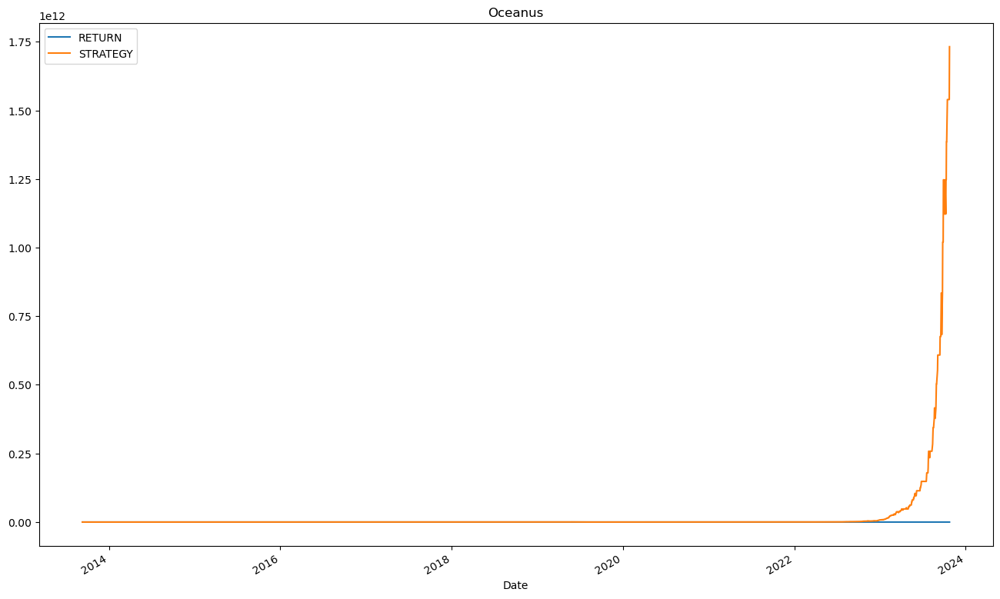

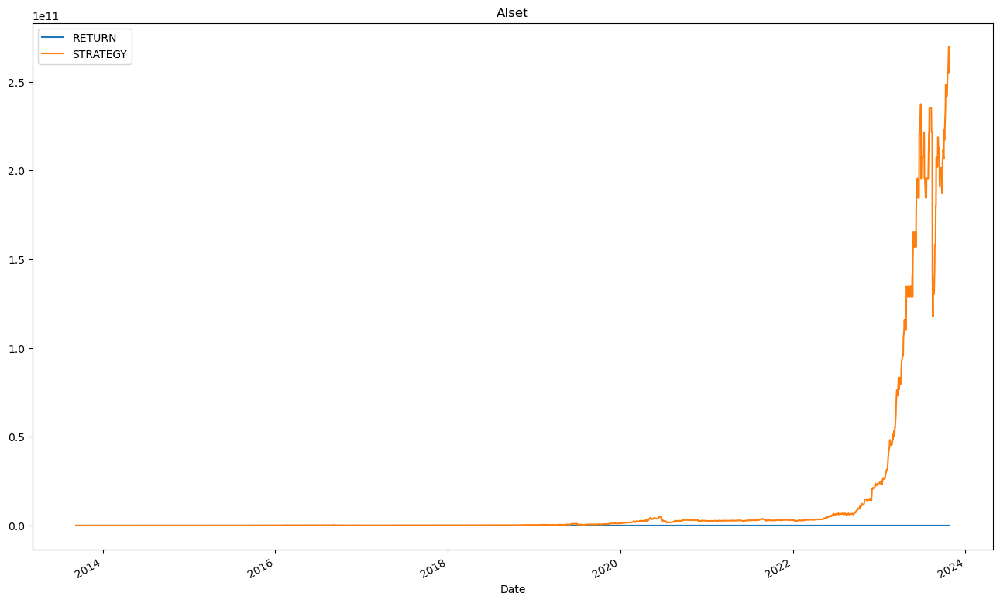

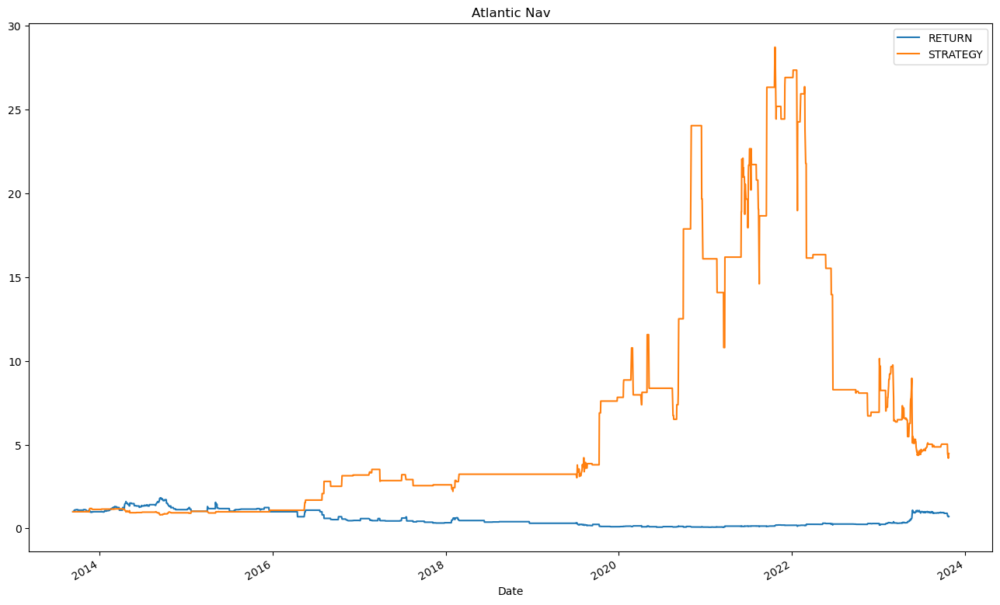

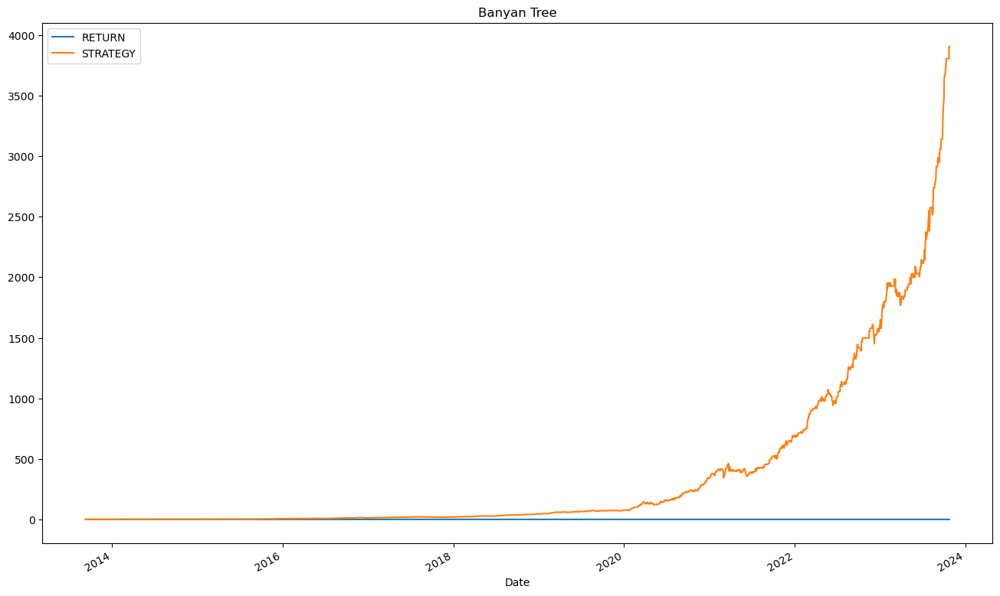

...

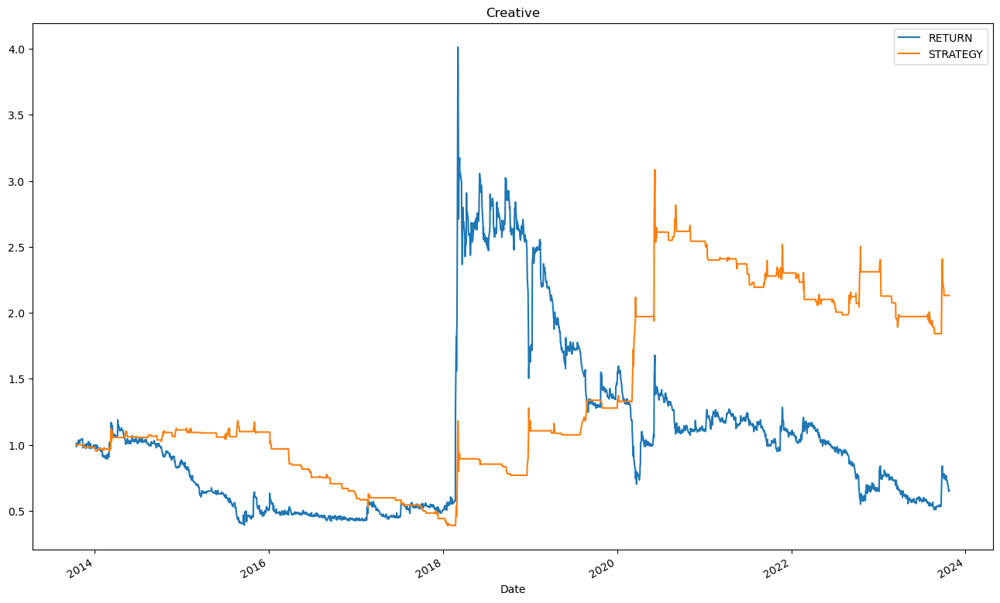

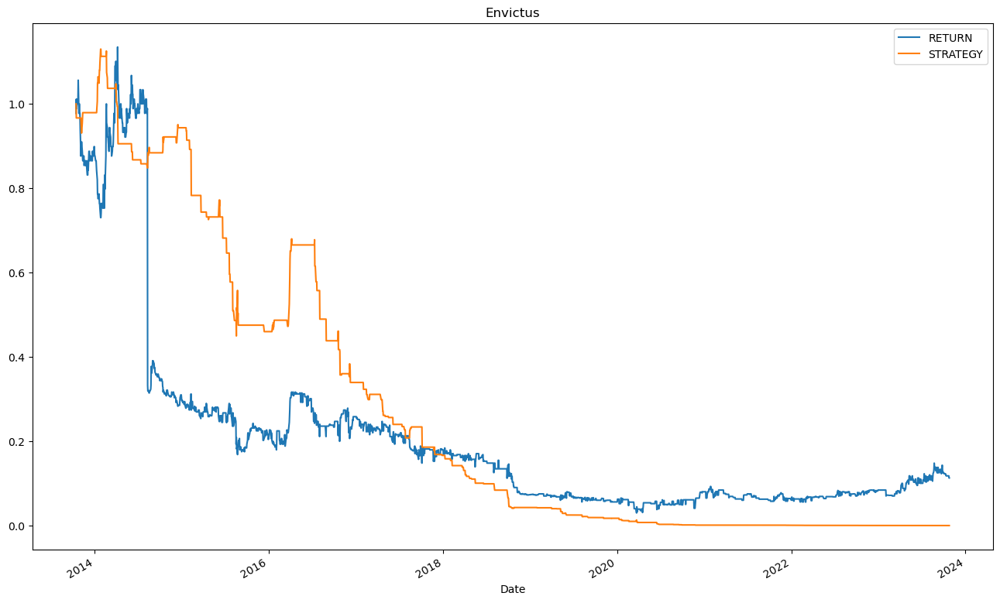

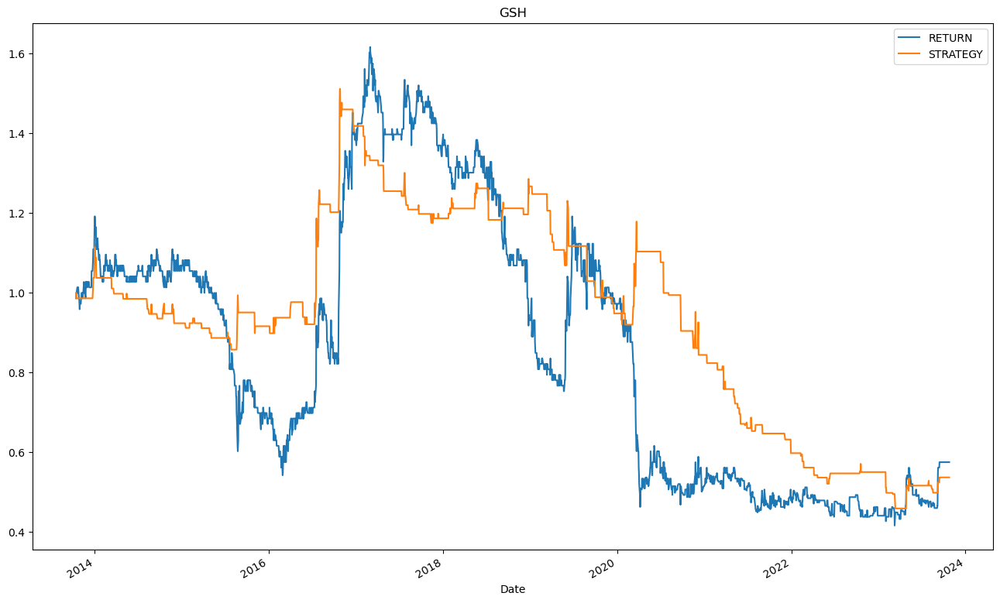

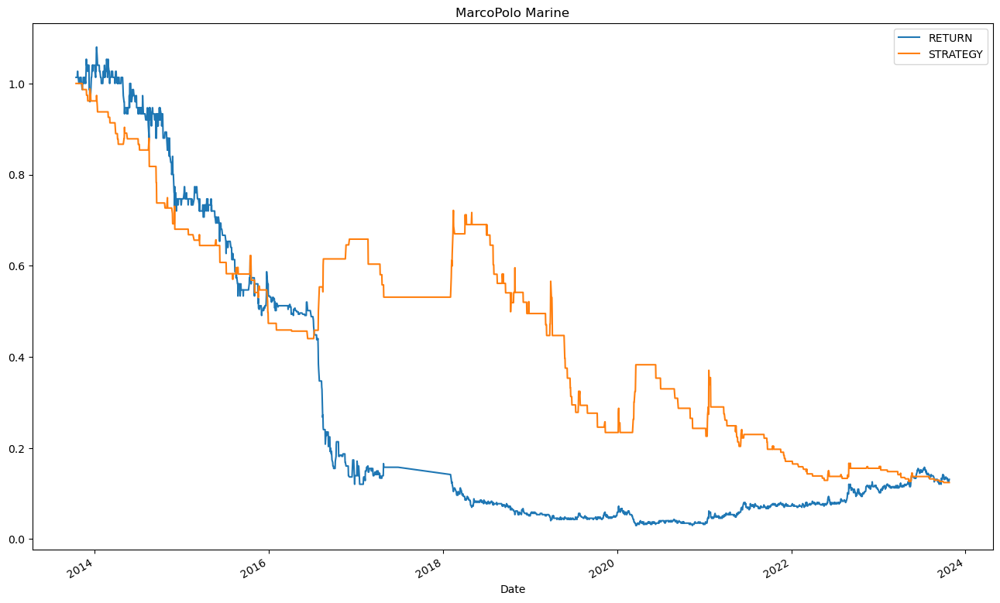

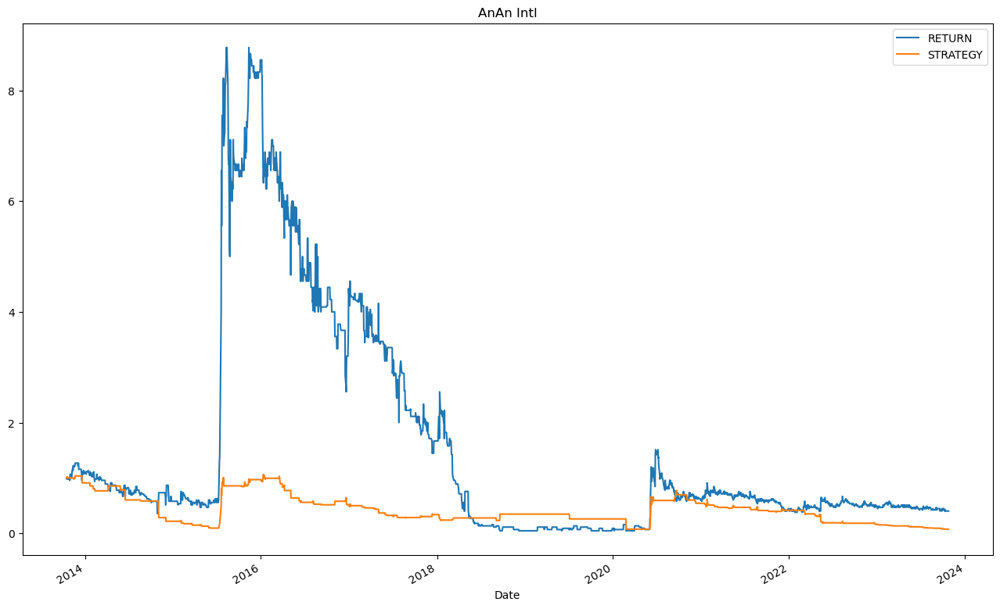

In [74]:
Mean_Rev_all_SND = plot_all_returns(stock_dict_SND,start, end, OLS_outcome, sig_OLS_predict)
Mean_Rev_all_SND = Mean_Rev_all_SND.drop(['WIN', 'LOSS'], axis = 1)

new_columns_MeRe = {"Total_R": "Total_R_MeRe",
                    "WIN%": "WIN%_MeRe",
                    }
Mean_Rev_all_SND = Mean_Rev_all_SND.rename(columns= new_columns_MeRe)

# Mmt

Mmt_all_SND = plot_all_returns(stock_dict_SND, start, end, [], sig_ICHI_CCI)
Mmt_all_SND = Mmt_all_SND.drop(['WIN', 'LOSS'], axis = 1)

new_columns_Mmt = {"Total_R": "Total_R_Mmt",
                    "WIN%": "WIN%_Mmt"
                    }
Mmt_all_SND = Mmt_all_SND.rename(columns= new_columns_Mmt)

# Concat

SND_happytable = pd.concat([Mean_Rev_all_SND, Mmt_all_SND], axis = 1)
SND_happytable.redex

In [ ]:
Greatjob_by_tim_cai = pd.concat([CD_happytable,
                                 CND_happytable,
                                 USD_happytable,
                                 USND_happytable,
                                 SD_happytable,
                                 SND_happytable 
                                 ]
                                 , axis = 0)
Greatjob_by_tim_cai

In [ ]:
Greatjob_by_tim_cai.to_csv("Excellent.csv")
